# Problem 1

In [84]:
import torch
from torch import nn
import warnings
import numpy as np

warnings.simplefilter(action='ignore', category=UserWarning)
from chainer_chemistry import datasets
from chainer_chemistry.dataset.preprocessors.ggnn_preprocessor import GGNNPreprocessor

from tensorflow import keras
import tensorflow as tf
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler,MinMaxScaler,normalize
from sklearn.metrics import r2_score,SCORERS,mean_absolute_error,max_error,mean_squared_error
from sklearn.model_selection import GridSearchCV

In [159]:
"""
    load data
"""
dataset, dataset_smiles = datasets.get_qm9(GGNNPreprocessor(kekulize=True), return_smiles=True,
                                           target_index=np.random.choice(range(133000), 6000, False))

V = 9
atom_types = [6, 8, 7, 9, 1]

100%|██████████████████████████████████████████████████████████| 6000/6000 [00:05<00:00, 1158.09it/s]


In [160]:
def adj(x):
    x = x[1]
    adjacency = np.zeros((V, V)).astype(float)
    adjacency[:len(x[0]), :len(x[0])] = x[0] + 2 * x[1] + 3 * x[2]
    return torch.tensor(adjacency)


def sig(x):
    x = x[0]
    atoms = np.ones((V)).astype(float)
    atoms[:len(x)] = x
    out = np.array([int(atom == atom_type) for atom_type in atom_types for atom in atoms]).astype(float)
    return torch.tensor(out).reshape(5, len(atoms)).T


def target(x):
    x = x[2]
    return torch.tensor(x)


#since I don't know how to convert adjacent matrix to degree matrix inside a module, I calculate degree matrxi outside
# and make it as another input
def degree(adj):
    diagnal = [1,1,1,1,1,1,1,1,1]
    adj = tf.linalg.diag(diagnal).numpy() + adj.numpy()
    D = tf.reduce_sum(adj,0).numpy()
    D = tf.math.reciprocal(tf.sqrt(D)).numpy()
    D = tf.linalg.diag(D)
    return D

In [161]:
adjs = tf.stack(list(map(adj, dataset)))
sigs = tf.stack(list(map(sig, dataset)))
prop = tf.stack(list(map(target, dataset)))[:, 5]
degrees = tf.stack(list(map(degree, adjs)))

#try different scaler
prop_nm = normalize(prop.numpy().reshape(1,-1), norm='l2').astype(np.float64)[0]
prop_mm = MinMaxScaler().fit_transform(prop.numpy().reshape(-1,1))
prop_st = StandardScaler().fit_transform(prop.numpy().reshape(-1,1))

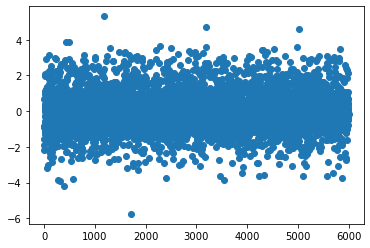

In [7]:
# plt.scatter(np.arange(len(prop)),prop)
# plt.scatter(np.arange(len(prop)),prop_1)
plt.scatter(np.arange(len(prop)),prop_st)

In [162]:
class GCN(keras.layers.Layer):
    """
        Graph convolutional layer
    """
    def __init__(self,
                 in_features = 5,
                 out_features = 3,
                 activation = 'relu',
                 initializer = 'random_normal'):
        super().__init__()
        self.in_features = in_features
        self.out_features = out_features    
        self.activataion = activation
        self.initializer = initializer
        
        
        #initiallize weight and bias with random initialier. size of wieght and bias are depended on input and output size
        self.w_N = self.add_weight(shape=(self.in_features,self.out_features),
                                initializer=self.initializer,
                                trainable=True,
                                dtype = tf.float64,
                                name = 'W')
        self.b_N = self.add_weight(shape=(self.out_features,),
                                initializer=self.initializer,
                                trainable=True,
                                dtype = tf.float64,
                                name = 'b')

    def call(self, A, H, D):
        
        A = tf.cast(A,dtype=tf.float64)
        #use relu as activation
        activation = tf.keras.activations.get(self.activataion)
        # D^(-1/2)
        D_n12 = D
        #matrxi multiplication
        DA = tf.matmul(D_n12,A)
        DAD = tf.matmul(DA,D_n12)
        DADH = tf.matmul(DAD,H)
        DADHW = tf.matmul(DADH,self.w_N) + self.b_N
        H_new = activation(DADHW)
        
        return H_new
    
class GraphPooling(keras.layers.Layer):
    
    def call(self,H):
        z = tf.reduce_sum(H,1)
        return z

In [163]:
# constrcut keras model
#define inputs
A_input = keras.Input(name = 'A_input',shape=(9,9),dtype=tf.float64)
H_input = keras.Input(name = 'H_input',shape=(9,5),dtype=tf.float64)
D_input = keras.Input(name = 'D_input',shape=(9,9),dtype=tf.float64)

#define GCN layer
gcn_layer = GCN()
H_gcn = gcn_layer(A_input,H_input,D_input)

#defeine graphpooling layer
gp_layer = GraphPooling()
graph_layer = gp_layer(H_gcn)

#fully connected layer
fully_connected_layer_1 = keras.layers.Dense(2,activation = 'relu')(graph_layer)
# fully_connected_layer_2 = keras.layers.Dense(300,activation = 'relu')(fully_connected_layer_1)
# fully_connected_layer_3 = keras.layers.Dense(100,activation = 'relu')(fully_connected_layer_2)
# fully_connected_layer_4 = keras.layers.Dense(10,activation = 'relu')(fully_connected_layer_3)

#output
output = keras.layers.Dense(1)(fully_connected_layer_1)
output_bn = keras.layers.BatchNormalization(renorm=True,fused=False)(output)
model = tf.keras.Model(inputs=[A_input,H_input,D_input],
                  outputs=output)
model.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 A_input (InputLayer)           [(None, 9, 9)]       0           []                               
                                                                                                  
 H_input (InputLayer)           [(None, 9, 5)]       0           []                               
                                                                                                  
 D_input (InputLayer)           [(None, 9, 9)]       0           []                               
                                                                                                  
 gcn_18 (GCN)                   (None, 9, 3)         18          ['A_input[0][0]',                
                                                                  'H_input[0][0]',          

In [164]:
# split data into 4999 train, 1001 test
sigs_train,sigs_test,adjs_train,adjs_test,degrees_train,degrees_test,prop_train,prop_test = \
train_test_split(sigs.numpy(),adjs.numpy(),degrees.numpy(),prop_st,test_size=0.16667)
print(sigs_train.shape,sigs_test.shape)
print(adjs_train.shape,adjs_test.shape)
print(degrees_train.shape,degrees_test.shape)
print(prop_train.shape,prop_test.shape)

(4999, 9, 5) (1001, 9, 5)
(4999, 9, 9) (1001, 9, 9)
(4999, 9, 9) (1001, 9, 9)
(4999, 1) (1001, 1)


In [11]:
#use SGD with learning rate = 0.001
#use meansqurederror as loss
model.compile(
    optimizer=keras.optimizers.SGD(learning_rate=0.001),  # Optimizer
    # Loss function to minimize
    loss=keras.losses.MeanSquaredError(),
    # List of metrics to monitor
    metrics=[keras.metrics.MeanSquaredError()],
)

# use batch size of 50
# use 500 data as train and 4500 as validation
history=model.fit(
    x=[adjs_train,sigs_train,degrees_train], 
    y=prop_train, 
#     x=[adjs,sigs,degrees], 
#     y=prop, 
    batch_size=50, 
    epochs=50000, 
    validation_split = 0.1,
)

Epoch 1/50000
90/90 [==============================] - 1s 4ms/step - loss: 1.0011 - mean_squared_error: 1.0011 - val_loss: 0.8922 - val_mean_squared_error: 0.8922
Epoch 2/50000
90/90 [==============================] - 0s 2ms/step - loss: 1.0011 - mean_squared_error: 1.0011 - val_loss: 0.8921 - val_mean_squared_error: 0.8921
Epoch 3/50000
90/90 [==============================] - 0s 2ms/step - loss: 1.0010 - mean_squared_error: 1.0010 - val_loss: 0.8921 - val_mean_squared_error: 0.8921
Epoch 4/50000
90/90 [==============================] - 0s 2ms/step - loss: 1.0010 - mean_squared_error: 1.0010 - val_loss: 0.8921 - val_mean_squared_error: 0.8921
Epoch 5/50000
90/90 [==============================] - 0s 2ms/step - loss: 1.0011 - mean_squared_error: 1.0011 - val_loss: 0.8920 - val_mean_squared_error: 0.8920
Epoch 6/50000
90/90 [==============================] - 0s 2ms/step - loss: 1.0010 - mean_squared_error: 1.0010 - val_loss: 0.8920 - val_mean_squared_error: 0.8920
Epoch 7/50000
90/90 [=

90/90 [==============================] - 0s 2ms/step - loss: 0.9666 - mean_squared_error: 0.9666 - val_loss: 0.8552 - val_mean_squared_error: 0.8552
Epoch 52/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9646 - mean_squared_error: 0.9646 - val_loss: 0.8527 - val_mean_squared_error: 0.8527
Epoch 53/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9630 - mean_squared_error: 0.9630 - val_loss: 0.8534 - val_mean_squared_error: 0.8534
Epoch 54/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9614 - mean_squared_error: 0.9614 - val_loss: 0.8521 - val_mean_squared_error: 0.8521
Epoch 55/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9605 - mean_squared_error: 0.9605 - val_loss: 0.8488 - val_mean_squared_error: 0.8488
Epoch 56/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9586 - mean_squared_error: 0.9586 - val_loss: 0.8488 - val_mean_squared_error: 0.8488
Epoch 57/50000
90/90 [=========

90/90 [==============================] - 0s 2ms/step - loss: 0.9288 - mean_squared_error: 0.9288 - val_loss: 0.8200 - val_mean_squared_error: 0.8200
Epoch 102/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9270 - mean_squared_error: 0.9270 - val_loss: 0.8208 - val_mean_squared_error: 0.8208
Epoch 103/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9283 - mean_squared_error: 0.9283 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 104/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9269 - mean_squared_error: 0.9269 - val_loss: 0.8196 - val_mean_squared_error: 0.8196
Epoch 105/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9258 - mean_squared_error: 0.9258 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 106/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9269 - mean_squared_error: 0.9269 - val_loss: 0.8244 - val_mean_squared_error: 0.8244
Epoch 107/50000
90/90 [===

Epoch 151/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9201 - mean_squared_error: 0.9201 - val_loss: 0.8147 - val_mean_squared_error: 0.8147
Epoch 152/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9191 - mean_squared_error: 0.9191 - val_loss: 0.8174 - val_mean_squared_error: 0.8174
Epoch 153/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9191 - mean_squared_error: 0.9191 - val_loss: 0.8154 - val_mean_squared_error: 0.8154
Epoch 154/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9179 - mean_squared_error: 0.9179 - val_loss: 0.8277 - val_mean_squared_error: 0.8277
Epoch 155/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9191 - mean_squared_error: 0.9191 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 156/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9188 - mean_squared_error: 0.9188 - val_loss: 0.8146 - val_mean_squared_error: 0.8146
Epoch 157/

Epoch 250/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9146 - mean_squared_error: 0.9146 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 251/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9153 - mean_squared_error: 0.9153 - val_loss: 0.8146 - val_mean_squared_error: 0.8146
Epoch 252/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9152 - mean_squared_error: 0.9152 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 253/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9147 - mean_squared_error: 0.9147 - val_loss: 0.8146 - val_mean_squared_error: 0.8146
Epoch 254/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9145 - mean_squared_error: 0.9145 - val_loss: 0.8210 - val_mean_squared_error: 0.8210
Epoch 255/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9151 - mean_squared_error: 0.9151 - val_loss: 0.8155 - val_mean_squared_error: 0.8155
Epoch 256/

Epoch 349/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9132 - mean_squared_error: 0.9132 - val_loss: 0.8151 - val_mean_squared_error: 0.8151
Epoch 350/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9123 - mean_squared_error: 0.9123 - val_loss: 0.8149 - val_mean_squared_error: 0.8149
Epoch 351/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9133 - mean_squared_error: 0.9133 - val_loss: 0.8155 - val_mean_squared_error: 0.8155
Epoch 352/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9134 - mean_squared_error: 0.9134 - val_loss: 0.8152 - val_mean_squared_error: 0.8152
Epoch 353/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9129 - mean_squared_error: 0.9129 - val_loss: 0.8155 - val_mean_squared_error: 0.8155
Epoch 354/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9125 - mean_squared_error: 0.9125 - val_loss: 0.8152 - val_mean_squared_error: 0.8152
Epoch 355/

Epoch 448/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9109 - mean_squared_error: 0.9109 - val_loss: 0.8174 - val_mean_squared_error: 0.8174
Epoch 449/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9119 - mean_squared_error: 0.9119 - val_loss: 0.8150 - val_mean_squared_error: 0.8150
Epoch 450/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9105 - mean_squared_error: 0.9105 - val_loss: 0.8150 - val_mean_squared_error: 0.8150
Epoch 451/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9108 - mean_squared_error: 0.9108 - val_loss: 0.8150 - val_mean_squared_error: 0.8150
Epoch 452/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9109 - mean_squared_error: 0.9109 - val_loss: 0.8157 - val_mean_squared_error: 0.8157
Epoch 453/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9105 - mean_squared_error: 0.9105 - val_loss: 0.8150 - val_mean_squared_error: 0.8150
Epoch 454/

Epoch 547/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9093 - mean_squared_error: 0.9093 - val_loss: 0.8205 - val_mean_squared_error: 0.8205
Epoch 548/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9103 - mean_squared_error: 0.9103 - val_loss: 0.8160 - val_mean_squared_error: 0.8160
Epoch 549/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9100 - mean_squared_error: 0.9100 - val_loss: 0.8159 - val_mean_squared_error: 0.8159
Epoch 550/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9104 - mean_squared_error: 0.9104 - val_loss: 0.8160 - val_mean_squared_error: 0.8160
Epoch 551/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9113 - mean_squared_error: 0.9113 - val_loss: 0.8152 - val_mean_squared_error: 0.8152
Epoch 552/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9099 - mean_squared_error: 0.9099 - val_loss: 0.8157 - val_mean_squared_error: 0.8157
Epoch 553/

Epoch 646/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9078 - mean_squared_error: 0.9078 - val_loss: 0.8155 - val_mean_squared_error: 0.8155
Epoch 647/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9094 - mean_squared_error: 0.9094 - val_loss: 0.8158 - val_mean_squared_error: 0.8158
Epoch 648/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9096 - mean_squared_error: 0.9096 - val_loss: 0.8160 - val_mean_squared_error: 0.8160
Epoch 649/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9093 - mean_squared_error: 0.9093 - val_loss: 0.8155 - val_mean_squared_error: 0.8155
Epoch 650/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9080 - mean_squared_error: 0.9080 - val_loss: 0.8155 - val_mean_squared_error: 0.8155
Epoch 651/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9097 - mean_squared_error: 0.9097 - val_loss: 0.8156 - val_mean_squared_error: 0.8156
Epoch 652/

Epoch 745/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9088 - mean_squared_error: 0.9088 - val_loss: 0.8157 - val_mean_squared_error: 0.8157
Epoch 746/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9087 - mean_squared_error: 0.9087 - val_loss: 0.8166 - val_mean_squared_error: 0.8166
Epoch 747/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9086 - mean_squared_error: 0.9086 - val_loss: 0.8162 - val_mean_squared_error: 0.8162
Epoch 748/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9078 - mean_squared_error: 0.9078 - val_loss: 0.8197 - val_mean_squared_error: 0.8197
Epoch 749/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9087 - mean_squared_error: 0.9087 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 750/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9093 - mean_squared_error: 0.9093 - val_loss: 0.8164 - val_mean_squared_error: 0.8164
Epoch 751/

Epoch 844/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9077 - mean_squared_error: 0.9077 - val_loss: 0.8160 - val_mean_squared_error: 0.8160
Epoch 845/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9077 - mean_squared_error: 0.9077 - val_loss: 0.8159 - val_mean_squared_error: 0.8159
Epoch 846/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9079 - mean_squared_error: 0.9079 - val_loss: 0.8164 - val_mean_squared_error: 0.8164
Epoch 847/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9082 - mean_squared_error: 0.9082 - val_loss: 0.8159 - val_mean_squared_error: 0.8159
Epoch 848/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9086 - mean_squared_error: 0.9086 - val_loss: 0.8162 - val_mean_squared_error: 0.8162
Epoch 849/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9075 - mean_squared_error: 0.9075 - val_loss: 0.8169 - val_mean_squared_error: 0.8169
Epoch 850/

Epoch 943/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9072 - mean_squared_error: 0.9072 - val_loss: 0.8162 - val_mean_squared_error: 0.8162
Epoch 944/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9080 - mean_squared_error: 0.9080 - val_loss: 0.8161 - val_mean_squared_error: 0.8161
Epoch 945/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9080 - mean_squared_error: 0.9080 - val_loss: 0.8169 - val_mean_squared_error: 0.8169
Epoch 946/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9072 - mean_squared_error: 0.9072 - val_loss: 0.8165 - val_mean_squared_error: 0.8165
Epoch 947/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9075 - mean_squared_error: 0.9075 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 948/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9086 - mean_squared_error: 0.9086 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 949/

90/90 [==============================] - 0s 2ms/step - loss: 0.9087 - mean_squared_error: 0.9087 - val_loss: 0.8171 - val_mean_squared_error: 0.8171
Epoch 1042/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9071 - mean_squared_error: 0.9071 - val_loss: 0.8172 - val_mean_squared_error: 0.8172
Epoch 1043/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9073 - mean_squared_error: 0.9073 - val_loss: 0.8166 - val_mean_squared_error: 0.8166
Epoch 1044/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9071 - mean_squared_error: 0.9071 - val_loss: 0.8174 - val_mean_squared_error: 0.8174
Epoch 1045/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9067 - mean_squared_error: 0.9067 - val_loss: 0.8214 - val_mean_squared_error: 0.8214
Epoch 1046/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9075 - mean_squared_error: 0.9075 - val_loss: 0.8172 - val_mean_squared_error: 0.8172
Epoch 1047/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9079 - mean_squared_error: 0.9079 - val_loss: 0.8175 - val_mean_squared_error: 0.8175
Epoch 1140/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9078 - mean_squared_error: 0.9078 - val_loss: 0.8167 - val_mean_squared_error: 0.8167
Epoch 1141/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9072 - mean_squared_error: 0.9072 - val_loss: 0.8166 - val_mean_squared_error: 0.8166
Epoch 1142/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9072 - mean_squared_error: 0.9072 - val_loss: 0.8166 - val_mean_squared_error: 0.8166
Epoch 1143/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8173 - val_mean_squared_error: 0.8173
Epoch 1144/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9072 - mean_squared_error: 0.9072 - val_loss: 0.8175 - val_mean_squared_error: 0.8175
Epoch 1145/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9069 - mean_squared_error: 0.9069 - val_loss: 0.8205 - val_mean_squared_error: 0.8205
Epoch 1238/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9063 - mean_squared_error: 0.9063 - val_loss: 0.8200 - val_mean_squared_error: 0.8200
Epoch 1239/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9064 - mean_squared_error: 0.9064 - val_loss: 0.8171 - val_mean_squared_error: 0.8171
Epoch 1240/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9079 - mean_squared_error: 0.9079 - val_loss: 0.8167 - val_mean_squared_error: 0.8167
Epoch 1241/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9074 - mean_squared_error: 0.9074 - val_loss: 0.8172 - val_mean_squared_error: 0.8172
Epoch 1242/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9074 - mean_squared_error: 0.9074 - val_loss: 0.8168 - val_mean_squared_error: 0.8168
Epoch 1243/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9068 - mean_squared_error: 0.9068 - val_loss: 0.8168 - val_mean_squared_error: 0.8168
Epoch 1336/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9066 - mean_squared_error: 0.9066 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 1337/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9075 - mean_squared_error: 0.9075 - val_loss: 0.8174 - val_mean_squared_error: 0.8174
Epoch 1338/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9071 - mean_squared_error: 0.9071 - val_loss: 0.8170 - val_mean_squared_error: 0.8170
Epoch 1339/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9067 - mean_squared_error: 0.9067 - val_loss: 0.8168 - val_mean_squared_error: 0.8168
Epoch 1340/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9067 - mean_squared_error: 0.9067 - val_loss: 0.8172 - val_mean_squared_error: 0.8172
Epoch 1341/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9072 - mean_squared_error: 0.9072 - val_loss: 0.8170 - val_mean_squared_error: 0.8170
Epoch 1434/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9069 - mean_squared_error: 0.9069 - val_loss: 0.8173 - val_mean_squared_error: 0.8173
Epoch 1435/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9072 - mean_squared_error: 0.9072 - val_loss: 0.8171 - val_mean_squared_error: 0.8171
Epoch 1436/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9076 - mean_squared_error: 0.9076 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 1437/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9072 - mean_squared_error: 0.9072 - val_loss: 0.8175 - val_mean_squared_error: 0.8175
Epoch 1438/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9067 - mean_squared_error: 0.9067 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 1439/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9064 - mean_squared_error: 0.9064 - val_loss: 0.8172 - val_mean_squared_error: 0.8172
Epoch 1532/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8171 - val_mean_squared_error: 0.8171
Epoch 1533/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9071 - mean_squared_error: 0.9071 - val_loss: 0.8174 - val_mean_squared_error: 0.8174
Epoch 1534/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9071 - mean_squared_error: 0.9071 - val_loss: 0.8173 - val_mean_squared_error: 0.8173
Epoch 1535/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9065 - mean_squared_error: 0.9065 - val_loss: 0.8172 - val_mean_squared_error: 0.8172
Epoch 1536/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9063 - mean_squared_error: 0.9063 - val_loss: 0.8172 - val_mean_squared_error: 0.8172
Epoch 1537/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9078 - mean_squared_error: 0.9078 - val_loss: 0.8172 - val_mean_squared_error: 0.8172
Epoch 1630/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9068 - mean_squared_error: 0.9068 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 1631/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9074 - mean_squared_error: 0.9074 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 1632/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 1633/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8172 - val_mean_squared_error: 0.8172
Epoch 1634/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9071 - mean_squared_error: 0.9071 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 1635/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9069 - mean_squared_error: 0.9069 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 1728/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9071 - mean_squared_error: 0.9071 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 1729/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9067 - mean_squared_error: 0.9067 - val_loss: 0.8174 - val_mean_squared_error: 0.8174
Epoch 1730/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9067 - mean_squared_error: 0.9067 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 1731/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9064 - mean_squared_error: 0.9064 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 1732/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9071 - mean_squared_error: 0.9071 - val_loss: 0.8175 - val_mean_squared_error: 0.8175
Epoch 1733/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9069 - mean_squared_error: 0.9069 - val_loss: 0.8174 - val_mean_squared_error: 0.8174
Epoch 1826/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9064 - mean_squared_error: 0.9064 - val_loss: 0.8174 - val_mean_squared_error: 0.8174
Epoch 1827/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9065 - mean_squared_error: 0.9065 - val_loss: 0.8176 - val_mean_squared_error: 0.8176
Epoch 1828/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9064 - mean_squared_error: 0.9064 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 1829/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9067 - mean_squared_error: 0.9067 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 1830/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9071 - mean_squared_error: 0.9071 - val_loss: 0.8172 - val_mean_squared_error: 0.8172
Epoch 1831/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9062 - mean_squared_error: 0.9062 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 1924/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9064 - mean_squared_error: 0.9064 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 1925/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9064 - mean_squared_error: 0.9064 - val_loss: 0.8175 - val_mean_squared_error: 0.8175
Epoch 1926/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9065 - mean_squared_error: 0.9065 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 1927/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9067 - mean_squared_error: 0.9067 - val_loss: 0.8172 - val_mean_squared_error: 0.8172
Epoch 1928/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9070 - mean_squared_error: 0.9070 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 1929/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9068 - mean_squared_error: 0.9068 - val_loss: 0.8174 - val_mean_squared_error: 0.8174
Epoch 2022/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9066 - mean_squared_error: 0.9066 - val_loss: 0.8175 - val_mean_squared_error: 0.8175
Epoch 2023/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8175 - val_mean_squared_error: 0.8175
Epoch 2024/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9066 - mean_squared_error: 0.9066 - val_loss: 0.8175 - val_mean_squared_error: 0.8175
Epoch 2025/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9070 - mean_squared_error: 0.9070 - val_loss: 0.8175 - val_mean_squared_error: 0.8175
Epoch 2026/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9065 - mean_squared_error: 0.9065 - val_loss: 0.8175 - val_mean_squared_error: 0.8175
Epoch 2027/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9067 - mean_squared_error: 0.9067 - val_loss: 0.8175 - val_mean_squared_error: 0.8175
Epoch 2120/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9064 - mean_squared_error: 0.9064 - val_loss: 0.8200 - val_mean_squared_error: 0.8200
Epoch 2121/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8233 - val_mean_squared_error: 0.8233
Epoch 2122/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9068 - mean_squared_error: 0.9068 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 2123/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 2124/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9070 - mean_squared_error: 0.9070 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 2125/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8174 - val_mean_squared_error: 0.8174
Epoch 2218/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9067 - mean_squared_error: 0.9067 - val_loss: 0.8175 - val_mean_squared_error: 0.8175
Epoch 2219/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8176 - val_mean_squared_error: 0.8176
Epoch 2220/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9067 - mean_squared_error: 0.9067 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 2221/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9065 - mean_squared_error: 0.9065 - val_loss: 0.8175 - val_mean_squared_error: 0.8175
Epoch 2222/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 2223/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9065 - mean_squared_error: 0.9065 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 2316/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 2317/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9063 - mean_squared_error: 0.9063 - val_loss: 0.8175 - val_mean_squared_error: 0.8175
Epoch 2318/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9069 - mean_squared_error: 0.9069 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 2319/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9063 - mean_squared_error: 0.9063 - val_loss: 0.8176 - val_mean_squared_error: 0.8176
Epoch 2320/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8207 - val_mean_squared_error: 0.8207
Epoch 2321/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9062 - mean_squared_error: 0.9062 - val_loss: 0.8175 - val_mean_squared_error: 0.8175
Epoch 2414/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8218 - val_mean_squared_error: 0.8218
Epoch 2415/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9062 - mean_squared_error: 0.9062 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 2416/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9065 - mean_squared_error: 0.9065 - val_loss: 0.8176 - val_mean_squared_error: 0.8176
Epoch 2417/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9064 - mean_squared_error: 0.9064 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 2418/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 2419/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 2512/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9062 - mean_squared_error: 0.9062 - val_loss: 0.8176 - val_mean_squared_error: 0.8176
Epoch 2513/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 2514/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 2515/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9063 - mean_squared_error: 0.9063 - val_loss: 0.8176 - val_mean_squared_error: 0.8176
Epoch 2516/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9067 - mean_squared_error: 0.9067 - val_loss: 0.8176 - val_mean_squared_error: 0.8176
Epoch 2517/50000
90/9

90/90 [==============================] - 0s 3ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8175 - val_mean_squared_error: 0.8175
Epoch 2610/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 2611/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8175 - val_mean_squared_error: 0.8175
Epoch 2612/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9063 - mean_squared_error: 0.9063 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 2613/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9064 - mean_squared_error: 0.9064 - val_loss: 0.8176 - val_mean_squared_error: 0.8176
Epoch 2614/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8176 - val_mean_squared_error: 0.8176
Epoch 2615/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8203 - val_mean_squared_error: 0.8203
Epoch 2708/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 2709/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 2710/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 2711/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9064 - mean_squared_error: 0.9064 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 2712/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9063 - mean_squared_error: 0.9063 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 2713/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 2806/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 2807/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9062 - mean_squared_error: 0.9062 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 2808/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 2809/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9062 - mean_squared_error: 0.9062 - val_loss: 0.8199 - val_mean_squared_error: 0.8199
Epoch 2810/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 2811/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 2904/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 2905/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 2906/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 2907/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 2908/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9064 - mean_squared_error: 0.9064 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 2909/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 3002/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 3003/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9063 - mean_squared_error: 0.9063 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 3004/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9069 - mean_squared_error: 0.9069 - val_loss: 0.8176 - val_mean_squared_error: 0.8176
Epoch 3005/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 3006/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 3007/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 3100/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9066 - mean_squared_error: 0.9066 - val_loss: 0.8176 - val_mean_squared_error: 0.8176
Epoch 3101/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 3102/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9062 - mean_squared_error: 0.9062 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 3103/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9063 - mean_squared_error: 0.9063 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 3104/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 3105/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 3198/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9065 - mean_squared_error: 0.9065 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 3199/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 3200/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9062 - mean_squared_error: 0.9062 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 3201/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 3202/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9065 - mean_squared_error: 0.9065 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 3203/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 3296/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 3297/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8211 - val_mean_squared_error: 0.8211
Epoch 3298/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9065 - mean_squared_error: 0.9065 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 3299/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9062 - mean_squared_error: 0.9062 - val_loss: 0.8176 - val_mean_squared_error: 0.8176
Epoch 3300/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 3301/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 3394/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 3395/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 3396/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9062 - mean_squared_error: 0.9062 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 3397/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 3398/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9063 - mean_squared_error: 0.9063 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 3399/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 3492/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 3493/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9062 - mean_squared_error: 0.9062 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 3494/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 3495/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 3496/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 3497/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 3590/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 3591/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 3592/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 3593/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 3594/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8209 - val_mean_squared_error: 0.8209
Epoch 3595/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 3688/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 3689/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 3690/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 3691/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 3692/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 3693/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 3786/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9063 - mean_squared_error: 0.9063 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 3787/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 3788/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8218 - val_mean_squared_error: 0.8218
Epoch 3789/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9065 - mean_squared_error: 0.9065 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 3790/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 3791/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 3884/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 3885/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 3886/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 3887/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 3888/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 3889/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 3982/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8211 - val_mean_squared_error: 0.8211
Epoch 3983/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9062 - mean_squared_error: 0.9062 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 3984/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8215 - val_mean_squared_error: 0.8215
Epoch 3985/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 3986/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 3987/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 4080/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 4081/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 4082/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 4083/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 4084/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 4085/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9062 - mean_squared_error: 0.9062 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 4178/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 4179/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 4180/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 4181/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 4182/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 4183/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 4276/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 4277/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9063 - mean_squared_error: 0.9063 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 4278/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 4279/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 4280/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 4281/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 4374/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 4375/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 4376/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 4377/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 4378/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 4379/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 4472/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 4473/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 4474/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 4475/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 4476/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 4477/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 4570/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 4571/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 4572/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 4573/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 4574/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 4575/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 4668/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 4669/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 4670/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 4671/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 4672/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 4673/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 4766/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 4767/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 4768/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 4769/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9062 - mean_squared_error: 0.9062 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 4770/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 4771/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 4864/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 4865/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 4866/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 4867/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 4868/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 4869/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 4962/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 4963/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 4964/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 4965/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 4966/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8207 - val_mean_squared_error: 0.8207
Epoch 4967/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 5060/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 5061/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 5062/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 5063/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 5064/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 5065/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 5158/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 5159/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 5160/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 5161/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 5162/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 5163/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 5256/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 5257/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 5258/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 5259/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 5260/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 5261/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 5354/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 5355/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9043 - mean_squared_error: 0.9043 - val_loss: 0.8204 - val_mean_squared_error: 0.8204
Epoch 5356/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 5357/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 5358/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9063 - mean_squared_error: 0.9063 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 5359/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 5452/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 5453/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 5454/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 5455/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 5456/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8203 - val_mean_squared_error: 0.8203
Epoch 5457/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8198 - val_mean_squared_error: 0.8198
Epoch 5550/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 5551/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 5552/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 5553/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 5554/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 5555/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 5648/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 5649/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 5650/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 5651/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 5652/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 5653/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8177 - val_mean_squared_error: 0.8177
Epoch 5746/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 5747/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 5748/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 5749/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 5750/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 5751/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 5844/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 5845/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8196 - val_mean_squared_error: 0.8196
Epoch 5846/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 5847/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 5848/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 5849/50000
90/9

90/90 [==============================] - 0s 3ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 5942/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 5943/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 5944/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 5945/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 5946/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 5947/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8203 - val_mean_squared_error: 0.8203
Epoch 6040/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 6041/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 6042/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 6043/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 6044/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 6045/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 6138/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9043 - mean_squared_error: 0.9043 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 6139/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 6140/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 6141/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 6142/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 6143/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 6236/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 6237/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 6238/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 6239/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 6240/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 6241/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8199 - val_mean_squared_error: 0.8199
Epoch 6334/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 6335/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 6336/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 6337/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 6338/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8198 - val_mean_squared_error: 0.8198
Epoch 6339/50000
90/9

90/90 [==============================] - 0s 3ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 6432/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 6433/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 6434/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 6435/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 6436/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 6437/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 6530/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 6531/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 6532/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 6533/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 6534/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 6535/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 6628/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 6629/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 6630/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 6631/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 6632/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 6633/50000
90/9

90/90 [==============================] - 0s 3ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 6726/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 6727/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 6728/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 6729/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 6730/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 6731/50000
90/9

90/90 [==============================] - 0s 3ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 6824/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 6825/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 6826/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 6827/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 6828/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 6829/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 6922/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 6923/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 6924/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 6925/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 6926/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 6927/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 7020/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9061 - mean_squared_error: 0.9061 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 7021/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 7022/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8206 - val_mean_squared_error: 0.8206
Epoch 7023/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 7024/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 7025/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 7118/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 7119/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 7120/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 7121/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 7122/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 7123/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 7216/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 7217/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 7218/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 7219/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8200 - val_mean_squared_error: 0.8200
Epoch 7220/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 7221/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 7314/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8178 - val_mean_squared_error: 0.8178
Epoch 7315/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 7316/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 7317/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 7318/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 7319/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 7412/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 7413/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 7414/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 7415/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 7416/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 7417/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 7510/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 7511/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 7512/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 7513/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 7514/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 7515/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9043 - mean_squared_error: 0.9043 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 7608/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 7609/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 7610/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 7611/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 7612/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 7613/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 7706/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 7707/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 7708/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8198 - val_mean_squared_error: 0.8198
Epoch 7709/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 7710/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 7711/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 7804/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 7805/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 7806/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 7807/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 7808/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 7809/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 7902/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 7903/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 7904/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 7905/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 7906/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 7907/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 8000/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 8001/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 8002/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 8003/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 8004/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 8005/50000
90/9

90/90 [==============================] - 0s 3ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 8098/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 8099/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9042 - mean_squared_error: 0.9042 - val_loss: 0.8222 - val_mean_squared_error: 0.8222
Epoch 8100/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9064 - mean_squared_error: 0.9064 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 8101/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 8102/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 8103/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 8196/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 8197/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 8198/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 8199/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 8200/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 8201/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 8294/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 8295/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 8296/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 8297/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 8298/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 8299/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 8392/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 8393/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 8394/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 8395/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 8396/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 8397/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 8490/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 8491/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9039 - mean_squared_error: 0.9039 - val_loss: 0.8213 - val_mean_squared_error: 0.8213
Epoch 8492/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 8493/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 8494/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 8495/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 8588/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 8589/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 8590/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 8591/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 8592/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 8593/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 8686/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 8687/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 8688/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 8689/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 8690/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 8691/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 8784/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 8785/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 8786/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 8787/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 8788/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 8789/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9041 - mean_squared_error: 0.9041 - val_loss: 0.8214 - val_mean_squared_error: 0.8214
Epoch 8882/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9059 - mean_squared_error: 0.9059 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 8883/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 8884/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 8885/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 8886/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 8887/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 8980/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 8981/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 8982/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 8983/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 8984/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 8985/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 9078/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 9079/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 9080/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 9081/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 9082/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 9083/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 9176/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 9177/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 9178/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 9179/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 9180/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 9181/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 9274/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 9275/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 9276/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 9277/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 9278/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 9279/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 9372/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 9373/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 9374/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 9375/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 9376/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8179 - val_mean_squared_error: 0.8179
Epoch 9377/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 9470/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 9471/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 9472/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 9473/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 9474/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 9475/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 9568/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 9569/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 9570/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 9571/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 9572/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 9573/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 9666/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 9667/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 9668/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 9669/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 9670/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 9671/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 9764/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 9765/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 9766/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 9767/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 9768/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8200 - val_mean_squared_error: 0.8200
Epoch 9769/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8204 - val_mean_squared_error: 0.8204
Epoch 9862/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 9863/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 9864/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 9865/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 9866/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 9867/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 9960/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 9961/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 9962/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 9963/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 9964/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 9965/50000
90/9

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 10058/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 10059/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 10060/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 10061/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 10062/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9060 - mean_squared_error: 0.9060 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 10063/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 10156/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 10157/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 10158/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 10159/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 10160/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 10161/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 10254/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 10255/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 10256/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 10257/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 10258/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 10259/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 10352/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 10353/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 10354/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 10355/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 10356/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 10357/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 10450/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 10451/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 10452/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 10453/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 10454/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 10455/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 10548/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 10549/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9044 - mean_squared_error: 0.9044 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 10550/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 10551/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 10552/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8200 - val_mean_squared_error: 0.8200
Epoch 10553/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8202 - val_mean_squared_error: 0.8202
Epoch 10646/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 10647/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 10648/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 10649/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 10650/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 10651/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 10744/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 10745/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 10746/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 10747/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 10748/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 10749/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 10842/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 10843/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 10844/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 10845/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 10846/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 10847/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 10940/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 10941/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 10942/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 10943/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 10944/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 10945/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 11038/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 11039/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 11040/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 11041/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 11042/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 11043/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 11136/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 11137/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 11138/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 11139/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 11140/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 11141/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 11234/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 11235/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8201 - val_mean_squared_error: 0.8201
Epoch 11236/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 11237/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 11238/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 11239/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 11332/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 11333/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 11334/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 11335/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 11336/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 11337/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 11430/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 11431/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 11432/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 11433/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 11434/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 11435/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 11528/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 11529/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8180 - val_mean_squared_error: 0.8180
Epoch 11530/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 11531/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 11532/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 11533/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 11626/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 11627/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 11628/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 11629/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 11630/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 11631/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 11724/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 11725/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 11726/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 11727/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 11728/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 11729/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 11822/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 11823/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 11824/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 11825/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 11826/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 11827/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 11920/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8208 - val_mean_squared_error: 0.8208
Epoch 11921/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 11922/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 11923/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 11924/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 11925/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9057 - mean_squared_error: 0.9057 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 12018/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 12019/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 12020/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 12021/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 12022/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 12023/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 12116/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 12117/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8182 - val_mean_squared_error: 0.8183
Epoch 12118/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 12119/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 12120/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 12121/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 12214/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 12215/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 12216/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 12217/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 12218/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 12219/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 12312/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 12313/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 12314/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 12315/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 12316/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8200 - val_mean_squared_error: 0.8200
Epoch 12317/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 12410/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 12411/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 12412/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9058 - mean_squared_error: 0.9058 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 12413/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8197 - val_mean_squared_error: 0.8197
Epoch 12414/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 12415/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 12508/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 12509/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8202 - val_mean_squared_error: 0.8202
Epoch 12510/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 12511/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 12512/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 12513/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 12606/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 12607/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 12608/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 12609/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 12610/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 12611/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 12704/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 12705/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 12706/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 12707/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 12708/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 12709/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 12802/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 12803/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 12804/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 12805/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 12806/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 12807/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 12900/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 12901/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 12902/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 12903/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 12904/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 12905/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 12998/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 12999/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 13000/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 13001/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 13002/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 13003/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 13096/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 13097/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 13098/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 13099/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 13100/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 13101/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 13194/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 13195/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 13196/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 13197/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 13198/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 13199/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 13292/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 13293/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 13294/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 13295/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 13296/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 13297/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 13390/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 13391/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 13392/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 13393/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 13394/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 13395/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 13488/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8197 - val_mean_squared_error: 0.8197
Epoch 13489/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 13490/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 13491/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 13492/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 13493/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 13586/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 13587/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 13588/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 13589/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 13590/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 13591/5000

90/90 [==============================] - 0s 3ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 13684/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 13685/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 13686/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 13687/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 13688/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 13689/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 13782/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 13783/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 13784/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 13785/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 13786/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 13787/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9042 - mean_squared_error: 0.9042 - val_loss: 0.8207 - val_mean_squared_error: 0.8207
Epoch 13880/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 13881/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 13882/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 13883/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 13884/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 13885/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 13978/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 13979/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 13980/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 13981/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 13982/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 13983/5000

90/90 [==============================] - 0s 3ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 14076/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 14077/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 14078/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 14079/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 14080/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 14081/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 14174/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 14175/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 14176/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 14177/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 14178/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 14179/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 14272/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 14273/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 14274/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 14275/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 14276/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 14277/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 14370/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 14371/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 14372/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 14373/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 14374/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 14375/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 14468/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 14469/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 14470/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 14471/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 14472/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 14473/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 14566/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 14567/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 14568/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 14569/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 14570/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 14571/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 14664/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 14665/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 14666/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 14667/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 14668/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 14669/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 14762/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 14763/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 14764/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 14765/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 14766/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 14767/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 14860/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 14861/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 14862/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 14863/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 14864/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8197 - val_mean_squared_error: 0.8197
Epoch 14865/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 14958/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 14959/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 14960/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 14961/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 14962/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 14963/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 15056/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 15057/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 15058/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 15059/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9042 - mean_squared_error: 0.9042 - val_loss: 0.8203 - val_mean_squared_error: 0.8203
Epoch 15060/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 15061/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 15154/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 15155/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 15156/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 15157/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 15158/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 15159/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 15252/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 15253/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 15254/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 15255/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 15256/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 15257/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 15350/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 15351/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 15352/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 15353/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 15354/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 15355/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 15448/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 15449/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 15450/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 15451/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 15452/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 15453/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 15546/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 15547/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 15548/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 15549/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 15550/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 15551/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 15644/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 15645/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 15646/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 15647/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 15648/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 15649/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 15742/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 15743/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 15744/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 15745/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 15746/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 15747/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 15840/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 15841/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 15842/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 15843/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 15844/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 15845/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 15938/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 15939/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 15940/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 15941/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 15942/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 15943/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 16036/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 16037/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 16038/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 16039/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 16040/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 16041/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 16134/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 16135/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 16136/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 16137/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 16138/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 16139/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 16232/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 16233/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 16234/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 16235/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 16236/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 16237/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 16330/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 16331/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 16332/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 16333/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8181 - val_mean_squared_error: 0.8181
Epoch 16334/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 16335/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 16428/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 16429/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 16430/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 16431/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 16432/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 16433/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 16526/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 16527/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 16528/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 16529/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 16530/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 16531/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 16624/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 16625/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 16626/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 16627/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 16628/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 16629/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 16722/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 16723/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 16724/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 16725/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 16726/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 16727/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 16820/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 16821/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 16822/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 16823/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 16824/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 16825/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 16918/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 16919/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 16920/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 16921/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 16922/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 16923/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 17016/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8204 - val_mean_squared_error: 0.8204
Epoch 17017/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 17018/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 17019/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 17020/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 17021/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 17114/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 17115/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 17116/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 17117/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 17118/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8182 - val_mean_squared_error: 0.8182
Epoch 17119/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 17212/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 17213/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 17214/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 17215/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 17216/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 17217/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 17310/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 17311/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 17312/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 17313/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 17314/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 17315/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 17408/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 17409/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 17410/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 17411/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 17412/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 17413/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 17506/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 17507/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 17508/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 17509/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 17510/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 17511/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 17604/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 17605/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 17606/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 17607/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 17608/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 17609/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 17702/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 17703/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 17704/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 17705/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 17706/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 17707/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 17800/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 17801/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 17802/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 17803/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 17804/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 17805/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 17898/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 17899/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9043 - mean_squared_error: 0.9043 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 17900/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8198 - val_mean_squared_error: 0.8198
Epoch 17901/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 17902/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 17903/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 17996/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 17997/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 17998/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 17999/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 18000/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 18001/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 18094/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 18095/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 18096/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 18097/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 18098/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 18099/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 18192/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8199 - val_mean_squared_error: 0.8199
Epoch 18193/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9056 - mean_squared_error: 0.9056 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 18194/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 18195/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 18196/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 18197/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 18290/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 18291/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 18292/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 18293/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 18294/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 18295/5000

90/90 [==============================] - 0s 3ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 18388/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 18389/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 18390/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 18391/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 18392/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 18393/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 18486/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 18487/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9044 - mean_squared_error: 0.9044 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 18488/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 18489/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 18490/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 18491/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 18584/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8203 - val_mean_squared_error: 0.8203
Epoch 18585/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 18586/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 18587/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 18588/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 18589/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 18682/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 18683/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 18684/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 18685/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 18686/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 18687/5000

90/90 [==============================] - 0s 3ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 18780/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 18781/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 18782/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 18783/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 18784/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 18785/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 18878/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 18879/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 18880/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8196 - val_mean_squared_error: 0.8196
Epoch 18881/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 18882/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 18883/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 18976/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 18977/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8202 - val_mean_squared_error: 0.8202
Epoch 18978/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 18979/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 18980/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 18981/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 19074/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 19075/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 19076/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 19077/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 19078/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 19079/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 19172/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 19173/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 19174/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 19175/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 19176/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 19177/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 19270/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 19271/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 19272/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 19273/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 19274/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 19275/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 19368/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 19369/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8198 - val_mean_squared_error: 0.8198
Epoch 19370/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 19371/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 19372/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 19373/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 19466/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 19467/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9042 - mean_squared_error: 0.9042 - val_loss: 0.8207 - val_mean_squared_error: 0.8207
Epoch 19468/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 19469/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8197 - val_mean_squared_error: 0.8197
Epoch 19470/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 19471/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 19564/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 19565/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9043 - mean_squared_error: 0.9043 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 19566/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 19567/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 19568/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8196 - val_mean_squared_error: 0.8196
Epoch 19569/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 19662/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 19663/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 19664/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 19665/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 19666/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 19667/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 19760/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 19761/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 19762/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 19763/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 19764/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 19765/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 19858/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 19859/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 19860/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 19861/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 19862/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9044 - mean_squared_error: 0.9044 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 19863/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 19956/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 19957/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 19958/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 19959/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 19960/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 19961/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 20054/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 20055/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 20056/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 20057/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 20058/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 20059/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 20152/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 20153/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8199 - val_mean_squared_error: 0.8199
Epoch 20154/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 20155/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 20156/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8199 - val_mean_squared_error: 0.8199
Epoch 20157/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 20250/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 20251/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 20252/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 20253/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 20254/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 20255/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 20348/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 20349/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 20350/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8196 - val_mean_squared_error: 0.8196
Epoch 20351/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 20352/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 20353/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 20446/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 20447/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 20448/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 20449/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 20450/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 20451/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 20544/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 20545/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 20546/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 20547/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 20548/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 20549/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 20642/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 20643/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 20644/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 20645/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 20646/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 20647/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 20740/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 20741/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 20742/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 20743/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 20744/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 20745/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 20838/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9041 - mean_squared_error: 0.9041 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 20839/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 20840/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 20841/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 20842/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 20843/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 20936/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 20937/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 20938/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 20939/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 20940/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 20941/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21034/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8200 - val_mean_squared_error: 0.8200
Epoch 21035/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 21036/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 21037/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21038/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 21039/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 21132/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 21133/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21134/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 21135/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21136/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 21137/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 21230/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21231/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21232/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 21233/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21234/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 21235/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 21328/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21329/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 21330/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 21331/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21332/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 21333/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9037 - mean_squared_error: 0.9037 - val_loss: 0.8203 - val_mean_squared_error: 0.8203
Epoch 21426/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 21427/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 21428/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21429/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21430/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 21431/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21524/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21525/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21526/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21527/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21528/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 21529/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21622/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 21623/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 21624/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 21625/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 21626/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 21627/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8196 - val_mean_squared_error: 0.8196
Epoch 21720/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 21721/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 21722/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 21723/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 21724/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21725/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21818/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21819/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21820/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8198 - val_mean_squared_error: 0.8198
Epoch 21821/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21822/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 21823/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21916/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 21917/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 21918/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21919/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 21920/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 21921/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22014/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 22015/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22016/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22017/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 22018/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22019/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 22112/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22113/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22114/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 22115/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 22116/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 22117/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 22210/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 22211/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22212/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 22213/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 22214/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22215/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22308/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22309/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22310/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22311/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22312/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 22313/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 22406/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 22407/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22408/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22409/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 22410/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22411/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 22504/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22505/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22506/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22507/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 22508/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 22509/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 22602/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22603/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22604/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 22605/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 22606/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 22607/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22700/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22701/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22702/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 22703/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 22704/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22705/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 22798/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 22799/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 22800/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22801/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 22802/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 22803/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 22896/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 22897/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22898/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 22899/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 22900/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9044 - mean_squared_error: 0.9044 - val_loss: 0.8198 - val_mean_squared_error: 0.8198
Epoch 22901/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 22994/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9042 - mean_squared_error: 0.9042 - val_loss: 0.8216 - val_mean_squared_error: 0.8216
Epoch 22995/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22996/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 22997/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 22998/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 22999/5000

90/90 [==============================] - 0s 3ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 23092/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 23093/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 23094/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 23095/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8196 - val_mean_squared_error: 0.8196
Epoch 23096/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 23097/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 23190/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 23191/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 23192/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 23193/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8196 - val_mean_squared_error: 0.8196
Epoch 23194/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 23195/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 23288/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 23289/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 23290/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8196 - val_mean_squared_error: 0.8196
Epoch 23291/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 23292/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 23293/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 23386/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 23387/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 23388/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 23389/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 23390/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 23391/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 23484/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 23485/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 23486/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 23487/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 23488/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 23489/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 23582/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 23583/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 23584/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 23585/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 23586/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 23587/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 23680/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 23681/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 23682/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 23683/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 23684/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 23685/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 23778/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 23779/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 23780/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 23781/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 23782/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 23783/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 23876/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 23877/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 23878/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 23879/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 23880/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 23881/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 23974/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 23975/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 23976/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 23977/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 23978/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 23979/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 24072/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 24073/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 24074/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 24075/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 24076/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 24077/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 24170/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 24171/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 24172/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 24173/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 24174/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 24175/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 24268/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 24269/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 24270/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 24271/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 24272/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 24273/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 24366/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 24367/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 24368/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 24369/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 24370/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 24371/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 24464/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 24465/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 24466/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 24467/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 24468/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 24469/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 24562/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 24563/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 24564/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 24565/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 24566/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 24567/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 24660/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 24661/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 24662/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 24663/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 24664/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 24665/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 24758/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 24759/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 24760/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 24761/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 24762/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 24763/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 24856/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 24857/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 24858/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 24859/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 24860/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 24861/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 24954/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 24955/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 24956/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 24957/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 24958/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 24959/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25052/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 25053/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 25054/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 25055/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25056/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 25057/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 25150/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25151/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 25152/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25153/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25154/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 25155/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25248/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 25249/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 25250/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 25251/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 25252/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25253/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25346/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 25347/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25348/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 25349/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 25350/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 25351/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 25444/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 25445/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25446/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 25447/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 25448/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 25449/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25542/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8183 - val_mean_squared_error: 0.8183
Epoch 25543/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 25544/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 25545/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 25546/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25547/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 25640/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25641/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25642/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 25643/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25644/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25645/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25738/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25739/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 25740/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 25741/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8196 - val_mean_squared_error: 0.8196
Epoch 25742/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25743/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25836/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25837/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9042 - mean_squared_error: 0.9042 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 25838/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25839/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25840/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 25841/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 25934/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 25935/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 25936/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 25937/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 25938/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 25939/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 26032/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 26033/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 26034/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 26035/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 26036/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 26037/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 26130/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 26131/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 26132/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 26133/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 26134/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 26135/5000

90/90 [==============================] - 0s 3ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 26228/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 26229/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 26230/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 26231/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 26232/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 26233/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 26326/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 26327/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 26328/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 26329/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 26330/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 26331/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 26424/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 26425/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 26426/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 26427/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 26428/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 26429/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 26522/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 26523/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 26524/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 26525/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 26526/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 26527/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 26620/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 26621/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 26622/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 26623/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 26624/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 26625/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 26718/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 26719/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 26720/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 26721/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 26722/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 26723/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 26816/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 26817/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 26818/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 26819/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 26820/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 26821/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 26914/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 26915/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 26916/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 26917/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 26918/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 26919/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 27012/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 27013/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 27014/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 27015/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 27016/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 27017/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 27110/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 27111/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 27112/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 27113/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 27114/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 27115/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 27208/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 27209/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 27210/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 27211/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 27212/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 27213/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 27306/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 27307/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 27308/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 27309/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 27310/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 27311/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 27404/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 27405/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 27406/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 27407/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 27408/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 27409/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 27502/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 27503/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9044 - mean_squared_error: 0.9044 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 27504/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 27505/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 27506/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 27507/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 27600/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8197 - val_mean_squared_error: 0.8197
Epoch 27601/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 27602/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 27603/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 27604/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 27605/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 27698/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 27699/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 27700/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 27701/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 27702/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8196 - val_mean_squared_error: 0.8196
Epoch 27703/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 27796/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 27797/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 27798/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8197 - val_mean_squared_error: 0.8197
Epoch 27799/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 27800/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 27801/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 27894/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 27895/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 27896/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8208 - val_mean_squared_error: 0.8208
Epoch 27897/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 27898/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 27899/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 27992/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 27993/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 27994/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 27995/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 27996/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 27997/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28090/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 28091/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 28092/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 28093/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 28094/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28095/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28188/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 28189/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 28190/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28191/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 28192/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28193/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28286/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 28287/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 28288/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 28289/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 28290/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28291/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 28384/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 28385/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 28386/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9044 - mean_squared_error: 0.9044 - val_loss: 0.8200 - val_mean_squared_error: 0.8200
Epoch 28387/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 28388/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9042 - mean_squared_error: 0.9042 - val_loss: 0.8216 - val_mean_squared_error: 0.8216
Epoch 28389/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 28482/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 28483/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28484/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28485/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 28486/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 28487/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 28580/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9041 - mean_squared_error: 0.9041 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 28581/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 28582/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 28583/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28584/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28585/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28678/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28679/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28680/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28681/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28682/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28683/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 28776/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28777/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8196 - val_mean_squared_error: 0.8196
Epoch 28778/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 28779/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 28780/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 28781/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 28874/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28875/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28876/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28877/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 28878/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 28879/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28972/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 28973/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 28974/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28975/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 28976/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 28977/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 29070/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 29071/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29072/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 29073/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 29074/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 29075/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29168/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8201 - val_mean_squared_error: 0.8201
Epoch 29169/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 29170/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29171/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 29172/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 29173/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 29266/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29267/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29268/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29269/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29270/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 29271/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 29364/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 29365/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 29366/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8199 - val_mean_squared_error: 0.8199
Epoch 29367/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 29368/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 29369/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29462/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 29463/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29464/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29465/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 29466/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29467/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29560/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29561/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29562/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8197 - val_mean_squared_error: 0.8197
Epoch 29563/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9054 - mean_squared_error: 0.9054 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29564/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 29565/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 29658/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29659/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29660/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 29661/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29662/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29663/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 29756/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8199 - val_mean_squared_error: 0.8199
Epoch 29757/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 29758/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 29759/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29760/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29761/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 29854/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29855/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29856/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29857/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 29858/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29859/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29952/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 29953/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 29954/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 29955/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 29956/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 29957/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 30050/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 30051/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 30052/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 30053/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9037 - mean_squared_error: 0.9037 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 30054/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 30055/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 30148/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 30149/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 30150/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 30151/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 30152/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 30153/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 30246/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 30247/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 30248/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 30249/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 30250/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 30251/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 30344/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8198 - val_mean_squared_error: 0.8198
Epoch 30345/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 30346/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 30347/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 30348/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 30349/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 30442/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 30443/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 30444/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 30445/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 30446/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 30447/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 30540/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 30541/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 30542/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 30543/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 30544/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 30545/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 30638/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 30639/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 30640/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 30641/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 30642/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 30643/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 30736/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 30737/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 30738/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 30739/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 30740/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 30741/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 30834/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 30835/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 30836/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 30837/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 30838/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 30839/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 30932/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 30933/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 30934/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 30935/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 30936/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 30937/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9044 - mean_squared_error: 0.9044 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 31030/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 31031/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 31032/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 31033/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 31034/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 31035/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 31128/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 31129/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 31130/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 31131/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 31132/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 31133/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 31226/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 31227/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 31228/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 31229/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 31230/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 31231/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 31324/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 31325/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 31326/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 31327/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 31328/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 31329/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 31422/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 31423/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 31424/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 31425/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 31426/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 31427/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 31520/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 31521/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 31522/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 31523/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 31524/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 31525/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 31618/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 31619/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 31620/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 31621/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 31622/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 31623/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 31716/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 31717/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 31718/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 31719/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 31720/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 31721/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 31814/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 31815/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 31816/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 31817/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 31818/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 31819/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 31912/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 31913/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 31914/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 31915/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 31916/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 31917/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 32010/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 32011/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 32012/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 32013/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 32014/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 32015/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 32108/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 32109/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 32110/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 32111/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 32112/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 32113/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9053 - mean_squared_error: 0.9053 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 32206/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9042 - mean_squared_error: 0.9042 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 32207/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 32208/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 32209/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 32210/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 32211/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 32304/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 32305/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 32306/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 32307/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 32308/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 32309/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 32402/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 32403/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 32404/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 32405/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 32406/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 32407/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 32500/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 32501/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 32502/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 32503/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 32504/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 32505/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 32598/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 32599/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 32600/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 32601/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 32602/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 32603/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 32696/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 32697/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 32698/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 32699/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 32700/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 32701/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 32794/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 32795/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9040 - mean_squared_error: 0.9040 - val_loss: 0.8201 - val_mean_squared_error: 0.8201
Epoch 32796/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 32797/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 32798/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 32799/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 32892/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 32893/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 32894/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 32895/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 32896/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 32897/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 32990/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 32991/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 32992/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 32993/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 32994/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 32995/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 33088/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 33089/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 33090/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 33091/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 33092/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 33093/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 33186/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 33187/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 33188/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 33189/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 33190/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 33191/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 33284/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 33285/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 33286/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 33287/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 33288/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 33289/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 33382/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 33383/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 33384/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 33385/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 33386/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 33387/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 33480/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 33481/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 33482/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 33483/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 33484/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 33485/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 33578/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 33579/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 33580/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 33581/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 33582/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 33583/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 33676/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 33677/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 33678/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 33679/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 33680/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 33681/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 33774/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 33775/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 33776/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 33777/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 33778/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 33779/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 33872/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 33873/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 33874/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 33875/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 33876/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 33877/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 33970/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 33971/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 33972/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 33973/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 33974/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 33975/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 34068/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 34069/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8198 - val_mean_squared_error: 0.8198
Epoch 34070/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 34071/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 34072/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 34073/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 34166/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 34167/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 34168/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 34169/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 34170/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 34171/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 34264/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 34265/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 34266/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 34267/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 34268/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9043 - mean_squared_error: 0.9043 - val_loss: 0.8203 - val_mean_squared_error: 0.8203
Epoch 34269/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 34362/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 34363/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 34364/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 34365/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 34366/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 34367/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 34460/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 34461/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 34462/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 34463/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 34464/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 34465/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9044 - mean_squared_error: 0.9044 - val_loss: 0.8202 - val_mean_squared_error: 0.8202
Epoch 34558/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9055 - mean_squared_error: 0.9055 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 34559/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 34560/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 34561/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 34562/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 34563/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 34656/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 34657/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 34658/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 34659/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 34660/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 34661/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 34754/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 34755/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 34756/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 34757/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 34758/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8201 - val_mean_squared_error: 0.8201
Epoch 34759/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 34852/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 34853/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 34854/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 34855/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 34856/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 34857/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 34950/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 34951/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 34952/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 34953/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 34954/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 34955/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 35048/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 35049/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 35050/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 35051/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 35052/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9043 - mean_squared_error: 0.9043 - val_loss: 0.8200 - val_mean_squared_error: 0.8200
Epoch 35053/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 35146/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 35147/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 35148/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 35149/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 35150/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 35151/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 35244/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 35245/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 35246/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 35247/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 35248/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 35249/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 35342/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 35343/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 35344/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 35345/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 35346/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 35347/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 35440/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 35441/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 35442/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 35443/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 35444/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 35445/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 35538/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 35539/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 35540/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 35541/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 35542/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 35543/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 35636/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 35637/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 35638/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 35639/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 35640/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 35641/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 35734/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 35735/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 35736/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8197 - val_mean_squared_error: 0.8197
Epoch 35737/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 35738/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8184 - val_mean_squared_error: 0.8184
Epoch 35739/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 35832/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 35833/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 35834/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 35835/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 35836/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 35837/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 35930/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 35931/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 35932/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 35933/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 35934/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 35935/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8197 - val_mean_squared_error: 0.8197
Epoch 36028/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 36029/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 36030/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 36031/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 36032/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 36033/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 36126/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 36127/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 36128/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 36129/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 36130/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 36131/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 36224/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 36225/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 36226/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 36227/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 36228/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 36229/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 36322/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 36323/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 36324/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 36325/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 36326/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 36327/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 36420/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 36421/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 36422/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 36423/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 36424/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 36425/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 36518/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 36519/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 36520/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 36521/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 36522/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 36523/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 36616/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 36617/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 36618/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 36619/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9044 - mean_squared_error: 0.9044 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 36620/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 36621/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 36714/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 36715/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 36716/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 36717/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 36718/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 36719/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9042 - mean_squared_error: 0.9042 - val_loss: 0.8204 - val_mean_squared_error: 0.8204
Epoch 36812/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 36813/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 36814/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 36815/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 36816/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 36817/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 36910/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 36911/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 36912/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 36913/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 36914/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 36915/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 37008/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9042 - mean_squared_error: 0.9042 - val_loss: 0.8200 - val_mean_squared_error: 0.8200
Epoch 37009/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 37010/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 37011/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 37012/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 37013/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 37106/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 37107/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 37108/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 37109/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 37110/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 37111/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 37204/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 37205/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 37206/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 37207/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 37208/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 37209/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 37302/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 37303/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 37304/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 37305/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 37306/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 37307/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 37400/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 37401/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 37402/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 37403/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 37404/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9040 - mean_squared_error: 0.9040 - val_loss: 0.8202 - val_mean_squared_error: 0.8202
Epoch 37405/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 37498/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8196 - val_mean_squared_error: 0.8196
Epoch 37499/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 37500/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 37501/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 37502/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 37503/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 37596/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 37597/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 37598/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 37599/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 37600/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 37601/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 37694/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 37695/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 37696/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 37697/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 37698/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 37699/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 37792/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 37793/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 37794/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 37795/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 37796/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 37797/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 37890/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 37891/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 37892/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 37893/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 37894/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 37895/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 37988/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 37989/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 37990/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 37991/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 37992/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 37993/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 38086/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 38087/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 38088/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 38089/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 38090/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 38091/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 38184/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8197 - val_mean_squared_error: 0.8197
Epoch 38185/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 38186/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 38187/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 38188/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 38189/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 38282/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 38283/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 38284/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 38285/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 38286/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 38287/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 38380/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 38381/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 38382/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 38383/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 38384/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 38385/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 38478/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 38479/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 38480/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 38481/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 38482/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 38483/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 38576/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 38577/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 38578/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 38579/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 38580/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 38581/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 38674/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 38675/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 38676/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 38677/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 38678/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 38679/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 38772/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 38773/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 38774/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 38775/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 38776/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 38777/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 38870/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 38871/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 38872/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 38873/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 38874/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 38875/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 38968/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 38969/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 38970/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 38971/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 38972/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 38973/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 39066/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 39067/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 39068/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 39069/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 39070/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 39071/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 39164/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 39165/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 39166/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 39167/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 39168/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 39169/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 39262/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 39263/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 39264/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 39265/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 39266/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 39267/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 39360/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 39361/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 39362/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 39363/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 39364/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 39365/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 39458/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 39459/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 39460/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 39461/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 39462/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 39463/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 39556/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 39557/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 39558/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 39559/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 39560/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 39561/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 39654/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 39655/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 39656/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 39657/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 39658/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 39659/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 39752/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 39753/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 39754/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 39755/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9044 - mean_squared_error: 0.9044 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 39756/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 39757/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 39850/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 39851/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 39852/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 39853/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 39854/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 39855/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 39948/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 39949/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 39950/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 39951/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 39952/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 39953/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 40046/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 40047/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 40048/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 40049/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 40050/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 40051/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 40144/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 40145/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 40146/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 40147/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 40148/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 40149/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 40242/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 40243/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 40244/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 40245/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 40246/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 40247/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 40340/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 40341/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 40342/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 40343/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 40344/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 40345/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 40438/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 40439/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 40440/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 40441/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 40442/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8194 - val_mean_squared_error: 0.8194
Epoch 40443/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 40536/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 40537/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 40538/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 40539/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 40540/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 40541/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 40634/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 40635/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 40636/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 40637/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 40638/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 40639/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 40732/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 40733/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 40734/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 40735/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 40736/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 40737/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 40830/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 40831/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 40832/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8199 - val_mean_squared_error: 0.8199
Epoch 40833/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 40834/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 40835/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 40928/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 40929/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 40930/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 40931/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8196 - val_mean_squared_error: 0.8196
Epoch 40932/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 40933/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 41026/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 41027/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9044 - mean_squared_error: 0.9044 - val_loss: 0.8196 - val_mean_squared_error: 0.8196
Epoch 41028/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 41029/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41030/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41031/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41124/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 41125/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41126/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41127/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 41128/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 41129/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41222/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 41223/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 41224/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41225/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 41226/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 41227/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41320/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 41321/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41322/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 41323/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41324/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41325/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 41418/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 41419/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 41420/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 41421/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 41422/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 41423/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 41516/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41517/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 41518/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 41519/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41520/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 41521/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 41614/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 41615/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 41616/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41617/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41618/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41619/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41712/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41713/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 41714/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41715/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 41716/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 41717/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 41810/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 41811/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41812/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 41813/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41814/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41815/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41908/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 41909/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 41910/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 41911/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 41912/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 41913/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 42006/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42007/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42008/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 42009/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42010/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 42011/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42104/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42105/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 42106/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42107/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 42108/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 42109/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 42202/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 42203/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42204/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 42205/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 42206/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42207/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 42300/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42301/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 42302/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 42303/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 42304/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42305/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42398/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42399/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42400/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42401/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 42402/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42403/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 42496/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 42497/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 42498/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42499/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 42500/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42501/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42594/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 42595/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 42596/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42597/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 42598/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 42599/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 42692/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 42693/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42694/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42695/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 42696/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 42697/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 42790/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 42791/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42792/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 42793/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 42794/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 42795/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42888/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42889/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42890/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 42891/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 42892/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42893/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 42986/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42987/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42988/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42989/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42990/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 42991/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9040 - mean_squared_error: 0.9040 - val_loss: 0.8208 - val_mean_squared_error: 0.8208
Epoch 43084/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 43085/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 43086/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 43087/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 43088/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 43089/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 43182/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 43183/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 43184/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 43185/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 43186/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 43187/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 43280/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 43281/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 43282/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 43283/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 43284/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 43285/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 43378/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 43379/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 43380/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 43381/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 43382/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 43383/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 43476/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 43477/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 43478/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 43479/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 43480/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 43481/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 43574/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 43575/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 43576/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 43577/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 43578/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 43579/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 43672/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 43673/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 43674/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 43675/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 43676/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 43677/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 43770/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 43771/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 43772/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 43773/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 43774/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 43775/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 43868/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 43869/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 43870/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 43871/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 43872/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 43873/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 43966/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 43967/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 43968/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 43969/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 43970/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 43971/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44064/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44065/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 44066/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 44067/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44068/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44069/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 44162/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 44163/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44164/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 44165/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 44166/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44167/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 44260/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44261/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44262/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 44263/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 44264/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44265/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 44358/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44359/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 44360/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 44361/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9041 - mean_squared_error: 0.9041 - val_loss: 0.8199 - val_mean_squared_error: 0.8199
Epoch 44362/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 44363/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44456/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44457/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 44458/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 44459/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 44460/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44461/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44554/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 44555/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44556/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 44557/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44558/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44559/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9044 - mean_squared_error: 0.9044 - val_loss: 0.8198 - val_mean_squared_error: 0.8198
Epoch 44652/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44653/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 44654/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 44655/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 44656/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44657/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 44750/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 44751/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 44752/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44753/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 44754/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44755/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 44848/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 44849/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44850/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 44851/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 44852/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 44853/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44946/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44947/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 44948/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 44949/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 44950/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 44951/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 45044/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9044 - mean_squared_error: 0.9044 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 45045/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45046/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45047/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45048/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 45049/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45142/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45143/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45144/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 45145/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45146/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 45147/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45240/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8198 - val_mean_squared_error: 0.8198
Epoch 45241/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 45242/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 45243/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 45244/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45245/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 45338/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45339/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45340/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45341/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 45342/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 45343/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45436/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 45437/50000
90/90 [==============================] - 0s 3ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45438/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45439/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 45440/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 45441/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45534/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45535/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45536/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45537/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 45538/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 45539/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45632/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 45633/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 45634/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 45635/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45636/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 45637/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45730/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45731/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 45732/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 45733/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45734/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 45735/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 45828/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 45829/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45830/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 45831/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 45832/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 45833/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45926/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 45927/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 45928/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 45929/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 45930/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 45931/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9042 - mean_squared_error: 0.9042 - val_loss: 0.8196 - val_mean_squared_error: 0.8196
Epoch 46024/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46025/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 46026/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 46027/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46028/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46029/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 46122/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 46123/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46124/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 46125/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46126/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46127/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46220/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46221/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46222/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 46223/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 46224/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46225/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 46318/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46319/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46320/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46321/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46322/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 46323/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 46416/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 46417/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 46418/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 46419/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46420/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46421/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 46514/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 46515/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9044 - mean_squared_error: 0.9044 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 46516/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 46517/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 46518/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 46519/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46612/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 46613/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46614/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 46615/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 46616/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 46617/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 46710/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 46711/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46712/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 46713/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46714/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 46715/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 46808/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46809/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 46810/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46811/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 46812/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46813/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 46906/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46907/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 46908/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46909/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46910/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 46911/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47004/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 47005/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47006/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47007/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8196 - val_mean_squared_error: 0.8196
Epoch 47008/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47009/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47102/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47103/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47104/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47105/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47106/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 47107/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47200/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 47201/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 47202/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47203/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8185 - val_mean_squared_error: 0.8185
Epoch 47204/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 47205/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 47298/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 47299/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47300/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47301/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 47302/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 47303/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 47396/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47397/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 47398/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 47399/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 47400/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 47401/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47494/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47495/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47496/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9044 - mean_squared_error: 0.9044 - val_loss: 0.8195 - val_mean_squared_error: 0.8195
Epoch 47497/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 47498/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47499/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47592/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47593/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47594/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8196 - val_mean_squared_error: 0.8196
Epoch 47595/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47596/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 47597/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47690/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47691/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 47692/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47693/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47694/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47695/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47788/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 47789/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47790/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47791/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 47792/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 47793/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 47886/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 47887/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 47888/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 47889/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 47890/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47891/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 47984/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 47985/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 47986/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47987/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47988/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 47989/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 48082/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 48083/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 48084/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 48085/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 48086/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 48087/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 48180/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 48181/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 48182/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9044 - mean_squared_error: 0.9044 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 48183/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 48184/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 48185/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 48278/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 48279/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 48280/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 48281/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 48282/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 48283/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 48376/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 48377/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 48378/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 48379/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 48380/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 48381/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 48474/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 48475/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 48476/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 48477/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 48478/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 48479/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9044 - mean_squared_error: 0.9044 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 48572/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 48573/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 48574/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 48575/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 48576/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 48577/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 48670/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 48671/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 48672/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 48673/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 48674/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 48675/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 48768/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 48769/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 48770/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 48771/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 48772/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 48773/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 48866/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 48867/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 48868/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 48869/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 48870/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 48871/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 48964/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8193 - val_mean_squared_error: 0.8193
Epoch 48965/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 48966/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 48967/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 48968/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 48969/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49062/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 49063/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 49064/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 49065/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49066/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 49067/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 49160/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49161/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49162/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49163/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 49164/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49165/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49258/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 49259/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 49260/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 49261/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 49262/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49263/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49356/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49357/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49358/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49359/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49360/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 49361/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49454/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 49455/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49456/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 49457/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 49458/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49459/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 49552/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 49553/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 49554/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49555/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 49556/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 49557/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49650/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49651/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49652/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49653/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49654/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8190 - val_mean_squared_error: 0.8190
Epoch 49655/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8192 - val_mean_squared_error: 0.8192
Epoch 49748/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49749/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 49750/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 49751/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8188 - val_mean_squared_error: 0.8188
Epoch 49752/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 49753/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9052 - mean_squared_error: 0.9052 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49846/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9047 - mean_squared_error: 0.9047 - val_loss: 0.8189 - val_mean_squared_error: 0.8189
Epoch 49847/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9046 - mean_squared_error: 0.9046 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 49848/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 49849/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9051 - mean_squared_error: 0.9051 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49850/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49851/5000

90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8187 - val_mean_squared_error: 0.8187
Epoch 49944/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9048 - mean_squared_error: 0.9048 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49945/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9045 - mean_squared_error: 0.9045 - val_loss: 0.8191 - val_mean_squared_error: 0.8191
Epoch 49946/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49947/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9049 - mean_squared_error: 0.9049 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49948/50000
90/90 [==============================] - 0s 2ms/step - loss: 0.9050 - mean_squared_error: 0.9050 - val_loss: 0.8186 - val_mean_squared_error: 0.8186
Epoch 49949/5000

In [12]:
path = '/afs/crc.nd.edu/user/x/xgao2/FROM_PANASAS/xgao2/DPG/HW4/Weigts'
model.save_weights(path)

0.8142320513725281


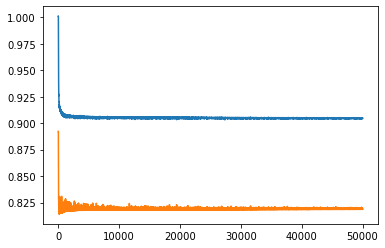

In [13]:
print(min(history.history['val_mean_squared_error']))
plt.plot(history.history['mean_squared_error'])
# plt.ylim([min(history.history['val_mean_squared_error']),min(history.history['val_mean_squared_error'])+0.000001])
plt.plot(history.history['val_mean_squared_error'])

100/100 [==============================] - 0s 1ms/step
Test set R2 = 0.08390820277539568
Test set MSE = 0.9579972
Test set Max Error = 4.596255


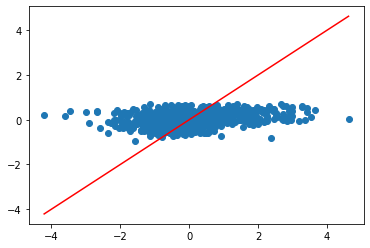

In [14]:
prop_test_pred = model.predict(
    x=[adjs_test,sigs_test,degrees_test],
    batch_size = 50,
)
prop_train_pred = model.predict(
    x=[adjs_train,sigs_train,degrees_train],
    batch_size =50,
)
total = np.concatenate([prop_test,prop_test_pred])
plt.scatter(prop_test,prop_test_pred)
plt.plot((min(total),max(total)),(min(total),max(total)),color='r')
print('Test set R2 =',r2_score(prop_test,prop_test_pred))
print('Test set MSE =',mean_squared_error(prop_test,prop_test_pred))
print('Test set Max Error =',max_error(prop_test,prop_test_pred))

# Problem 2

In [2]:
import torch

import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

from torch import nn
from torch.autograd.functional import jacobian

In [3]:
class GCN(keras.layers.Layer):
    """
        Graph convolutional layer
    """
    def __init__(self,
                 in_features = 5,
                 out_features = 3,
                 activation = 'relu',
                 initializer = 'random_normal'):
        super().__init__()
        self.in_features = in_features
        self.out_features = out_features    
        self.activataion = activation
        self.initializer = initializer
        
        self.w_N = self.add_weight(shape=(self.in_features,self.out_features),
                                initializer=self.initializer,
                                trainable=True,
                                dtype = tf.float64,
                                name = 'W')

    def call(self, A, H, D):
        
        A = tf.cast(A,dtype=tf.float64)
        activation = tf.keras.activations.get(self.activataion)
        D_n12 = D
        DA = tf.matmul(D_n12,A)
        DAD = tf.matmul(DA,D_n12)
        DADH = tf.matmul(DAD,H)
        DADHW = tf.matmul(DADH,self.w_N) 
        H_new = activation(DADHW)
        
        return H_new

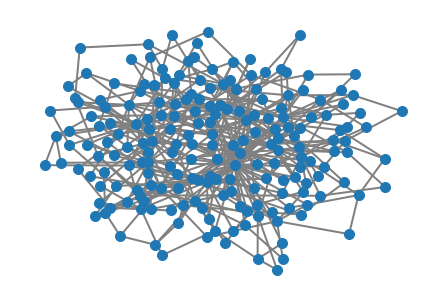

In [4]:
seed = 32
n_V = 200   # total number of nodes
G = nx.barabasi_albert_graph(n_V, 2, seed=seed)

# -- plot graph
layout = nx.spring_layout(G, seed=seed, iterations=400)
nx.draw(G, pos=layout, edge_color='gray', width=2, with_labels=False, node_size=100)

## A

In [5]:
diagnal = np.ones(200)
node_featuers = tf.linalg.diag(diagnal).numpy()

2022-11-14 16:08:22.525848: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /afs/crc.nd.edu/x86_64_linux/orca/orca_4_0_1_2_linux_x86-64_openmpi202//lib:/afs/.crc.nd.edu/x86_64_linux/p/python/3.7.3/gcc/lib:/opt/crc/p/python/3.7.3/gcc/lib:/opt/crc/i/isl/0.18/gcc/4.8.5/lib:/opt/crc/g/gdb/8.3/gcc/8.3.0/lib:/opt/crc/g/gcc/8.3.0/lib64:/opt/crc/g/gcc/8.3.0/lib:/afs/crc.nd.edu/x86_64_linux/t/tcltk/8.6.8/lib:/opt/crc/l/lammps/03Mar20/08-18-2022//lib64:/opt/crc/o/openmpi/4.0.1/intel/19.0/lib/openmpi:/opt/crc/o/openmpi/4.0.1/intel/19.0/lib:/opt/crc/i/intel/19.0/tbb/lib/intel64_lin/gcc4.7:/opt/crc/i/intel/19.0/mkl/lib/intel64:/opt/crc/i/intel/19.0/lib/intel64:/opt/crc/i/intel/19.0/lib64:/afs/crc.nd.edu/x86_64_linux/g/gaussian/16/C01/g16/bsd:/afs/crc.nd.edu/x86_64_linux/g/gaussian/16/C01/g16:/afs/crc.nd.edu/x86_64_linux/s/scalapack/intel/1

## B

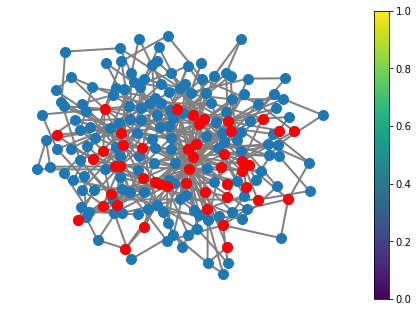

In [6]:
i = 17      # node ID
k = 2       # k-hop
# -- plot graph
layout = nx.spring_layout(G, seed=seed, iterations=400)
nx.draw(G, pos=layout, edge_color='gray', width=2, with_labels=False, node_size=100)
# -- plot neighborhood
nodes = nx.single_source_shortest_path_length(G, i, cutoff=k)
im2 = nx.draw_networkx_nodes(G, nodelist=nodes, label=nodes, pos=layout, node_color='red', node_size=100)

# -- visualize
plt.colorbar(im2)
plt.show()
plt.close()

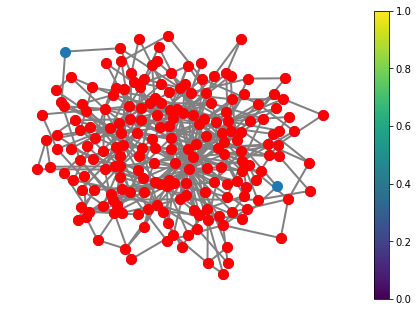

In [7]:
i = 17      # node ID
k = 4       # k-hop
# -- plot graph
layout = nx.spring_layout(G, seed=seed, iterations=400)
nx.draw(G, pos=layout, edge_color='gray', width=2, with_labels=False, node_size=100)
# -- plot neighborhood
nodes = nx.single_source_shortest_path_length(G, i, cutoff=k)
im2 = nx.draw_networkx_nodes(G, nodelist=nodes, label=nodes, pos=layout, node_color='red', node_size=100)

# -- visualize
plt.colorbar(im2)
plt.show()
plt.close()

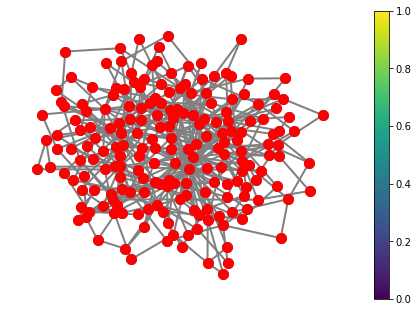

In [8]:
i = 17      # node ID
k = 6       # k-hop
# -- plot graph
layout = nx.spring_layout(G, seed=seed, iterations=400)
nx.draw(G, pos=layout, edge_color='gray', width=2, with_labels=False, node_size=100)
# -- plot neighborhood
nodes = nx.single_source_shortest_path_length(G, i, cutoff=k)
im2 = nx.draw_networkx_nodes(G, nodelist=nodes, label=nodes, pos=layout, node_color='red', node_size=100)

# -- visualize
plt.colorbar(im2)
plt.show()
plt.close()

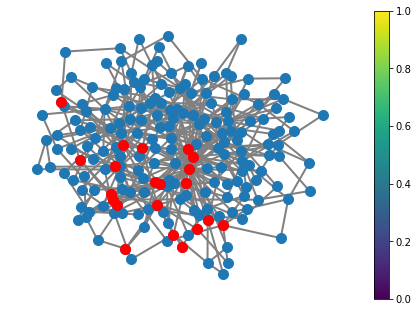

In [9]:
i = 27      # node ID
k = 2       # k-hop
# -- plot graph
layout = nx.spring_layout(G, seed=seed, iterations=400)
nx.draw(G, pos=layout, edge_color='gray', width=2, with_labels=False, node_size=100)
# -- plot neighborhood
nodes = nx.single_source_shortest_path_length(G, i, cutoff=k)
im2 = nx.draw_networkx_nodes(G, nodelist=nodes, label=nodes, pos=layout, node_color='red', node_size=100)

# -- visualize
plt.colorbar(im2)
plt.show()
plt.close()

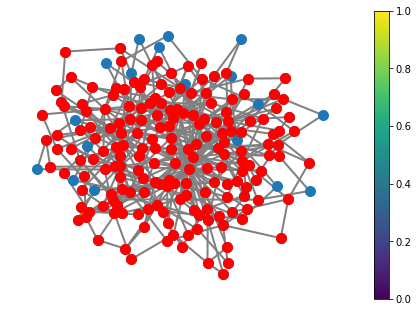

In [10]:
i = 27      # node ID
k = 4       # k-hop
# -- plot graph
layout = nx.spring_layout(G, seed=seed, iterations=400)
nx.draw(G, pos=layout, edge_color='gray', width=2, with_labels=False, node_size=100)
# -- plot neighborhood
nodes = nx.single_source_shortest_path_length(G, i, cutoff=k)
im2 = nx.draw_networkx_nodes(G, nodelist=nodes, label=nodes, pos=layout, node_color='red', node_size=100)

# -- visualize
plt.colorbar(im2)
plt.show()
plt.close()

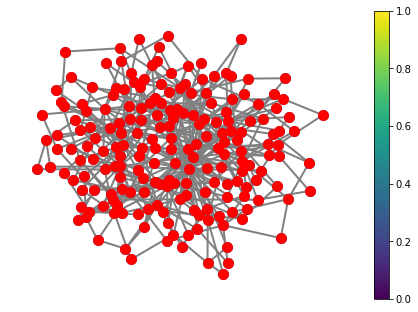

In [11]:
i = 27      # node ID
k = 6       # k-hop
# -- plot graph
layout = nx.spring_layout(G, seed=seed, iterations=400)
nx.draw(G, pos=layout, edge_color='gray', width=2, with_labels=False, node_size=100)
# -- plot neighborhood
nodes = nx.single_source_shortest_path_length(G, i, cutoff=k)
im2 = nx.draw_networkx_nodes(G, nodelist=nodes, label=nodes, pos=layout, node_color='red', node_size=100)

# -- visualize
plt.colorbar(im2)
plt.show()
plt.close()

## C v_17

200 -> 100

In [49]:
def degree_adj_self_loop(adj):
    diagnal = np.ones(len(adj))
    A = tf.linalg.diag(diagnal).numpy() + adj
    D = tf.reduce_sum(A,0).numpy()
    D = tf.math.reciprocal(tf.sqrt(D)).numpy()
    D = tf.linalg.diag(D)
    return A,D

# def matrix_derivative

In [50]:
A_input = keras.Input(name = 'A_input',shape=(200,200),dtype=tf.float64)
H_input = keras.Input(name = 'H_input',shape=(200,200),dtype=tf.float64)
D_input = keras.Input(name = 'D_input',shape=(200,200),dtype=tf.float64)

gcn_layer_1 = GCN(in_features=200,out_features=100)
# gcn_layer_2 = GCN(in_features=200,out_features=100)

H_1 = gcn_layer_1(A_input,H_input,D_input)
# H_2 = gcn_layer_2(A_input,H_1,D_input)



model = tf.keras.Model(inputs=[A_input,H_input,D_input],
                  outputs=H_1)
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 A_input (InputLayer)           [(None, 200, 200)]   0           []                               
                                                                                                  
 H_input (InputLayer)           [(None, 200, 200)]   0           []                               
                                                                                                  
 D_input (InputLayer)           [(None, 200, 200)]   0           []                               
                                                                                                  
 gcn_12 (GCN)                   (None, 200, 100)     20000       ['A_input[0][0]',                
                                                                  'H_input[0][0]',          

In [51]:
A_input = tf.convert_to_tensor(A)
H_input = tf.convert_to_tensor(node_featuers)
D_input = D
with tf.GradientTape() as tape:
    tape.watch(H_input)
    H_K = model([A_input,H_input,D_input])

# grads = tape.gradient(H_K,H_input[0])
grads = tape.jacobian(H_K,H_input)
v_17 = tf.reduce_sum(tf.reduce_sum(grads[17],0),1)
v_17.shape

TensorShape([200])

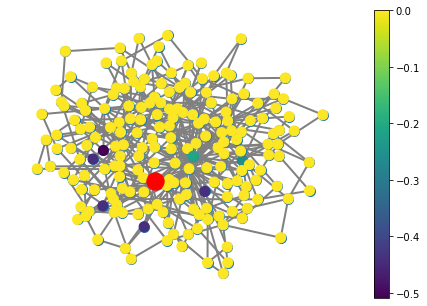

In [52]:
i = 17      # node ID
# -- plot graph
layout = nx.spring_layout(G, seed=seed, iterations=400)
nx.draw(G, pos=layout, edge_color='gray', width=2, with_labels=False, node_size=100)
# -- plot neighborhood
# -- plot neighborhood
nodes = G.nodes()
im2 = nx.draw_networkx_nodes(G, nodelist=nodes, label=nodes, pos=layout, node_color=v_17, node_size=100)
node_17 = nodes = nx.single_source_shortest_path_length(G, i, cutoff=0)
im = nx.draw_networkx_nodes(G, nodelist=node_17, label=node_17, pos=layout, node_color='red')

# -- visualize
plt.colorbar(im2)
plt.show()
plt.close()

200 -> 100 -> 50 -> 20

In [53]:
A_input = keras.Input(name = 'A_input',shape=(200,200),dtype=tf.float64)
H_input = keras.Input(name = 'H_input',shape=(200,200),dtype=tf.float64)
D_input = keras.Input(name = 'D_input',shape=(200,200),dtype=tf.float64)

gcn_layer_1 = GCN(in_features=200,out_features=100)
gcn_layer_2 = GCN(in_features=100,out_features=50)
gcn_layer_3 = GCN(in_features=50,out_features=20)

H_1 = gcn_layer_1(A_input,H_input,D_input)
H_2 = gcn_layer_2(A_input,H_1,D_input)
H_3 = gcn_layer_3(A_input,H_2,D_input)



model = tf.keras.Model(inputs=[A_input,H_input,D_input],
                  outputs=H_3)
model.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 A_input (InputLayer)           [(None, 200, 200)]   0           []                               
                                                                                                  
 H_input (InputLayer)           [(None, 200, 200)]   0           []                               
                                                                                                  
 D_input (InputLayer)           [(None, 200, 200)]   0           []                               
                                                                                                  
 gcn_13 (GCN)                   (None, 200, 100)     20000       ['A_input[0][0]',                
                                                                  'H_input[0][0]',          

In [56]:
A_input = tf.convert_to_tensor(A)
H_input = tf.convert_to_tensor(node_featuers)
D_input = D
with tf.GradientTape() as tape:
    tape.watch(H_input)
    H_K = model([A_input,H_input,D_input])

# grads = tape.gradient(H_K,H_input[0])
grads = tape.jacobian(H_K,H_input)
v_17 = tf.reduce_sum(tf.reduce_sum(grads[17],0),1)
v_17.shape

TensorShape([200])

In [57]:
grads.shape

TensorShape([200, 20, 200, 200])

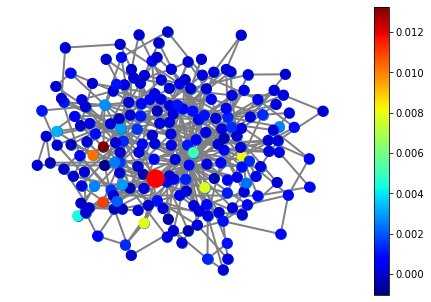

In [58]:
i = 17      # node ID
# -- plot graph
layout = nx.spring_layout(G, seed=seed, iterations=400)
nx.draw(G, pos=layout, edge_color='gray', width=2, with_labels=False, node_size=100)
# -- plot neighborhood
nodes = G.nodes()
im2 = nx.draw_networkx_nodes(G, nodelist=nodes, label=nodes, pos=layout, node_color=v_17, node_size=100,cmap=plt.cm.jet)
node_17 = nodes = nx.single_source_shortest_path_length(G, i, cutoff=0)
im = nx.draw_networkx_nodes(G, nodelist=node_17, label=node_17, pos=layout, node_color='red')

# -- visualize
plt.colorbar(im2)
plt.show()
plt.close()

200 -> 100 -> 50 -> 20 -> 20 -> 20

In [59]:
A_input = keras.Input(name = 'A_input',shape=(200,200),dtype=tf.float64)
H_input = keras.Input(name = 'H_input',shape=(200,200),dtype=tf.float64)
D_input = keras.Input(name = 'D_input',shape=(200,200),dtype=tf.float64)

gcn_layer_1 = GCN(in_features=200,out_features=100)
gcn_layer_2 = GCN(in_features=100,out_features=50)
gcn_layer_3 = GCN(in_features=50,out_features=20)
gcn_layer_4 = GCN(in_features=20,out_features=20)
gcn_layer_5 = GCN(in_features=20,out_features=20)

H_1 = gcn_layer_1(A_input,H_input,D_input)
H_2 = gcn_layer_2(A_input,H_1,D_input)
H_3 = gcn_layer_3(A_input,H_2,D_input)
H_4 = gcn_layer_4(A_input,H_3,D_input)
H_5 = gcn_layer_5(A_input,H_4,D_input)



model = tf.keras.Model(inputs=[A_input,H_input,D_input],
                  outputs=H_5)
model.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 A_input (InputLayer)           [(None, 200, 200)]   0           []                               
                                                                                                  
 H_input (InputLayer)           [(None, 200, 200)]   0           []                               
                                                                                                  
 D_input (InputLayer)           [(None, 200, 200)]   0           []                               
                                                                                                  
 gcn_16 (GCN)                   (None, 200, 100)     20000       ['A_input[0][0]',                
                                                                  'H_input[0][0]',          

In [60]:
A_input = tf.convert_to_tensor(A)
H_input = tf.convert_to_tensor(node_featuers)
D_input = D
with tf.GradientTape() as tape:
    tape.watch(H_input)
    H_K = model([A_input,H_input,D_input])

# grads = tape.gradient(H_K,H_input[0])
grads = tape.jacobian(H_K,H_input)
v_17 = tf.reduce_sum(tf.reduce_sum(grads[17],0),1)
v_17.shape

TensorShape([200])

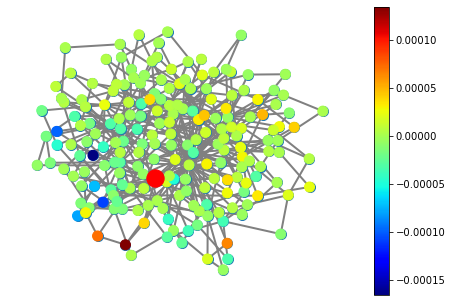

In [73]:
i = 17      # node ID
# -- plot graph
layout = nx.spring_layout(G, seed=seed, iterations=400)
nx.draw(G, pos=layout, edge_color='gray', width=2, with_labels=False, node_size=100)
# -- plot neighborhood
nodes = G.nodes()
im2 = nx.draw_networkx_nodes(G, nodelist=nodes, label=nodes, pos=layout, node_color=v_17, node_size=100,cmap=plt.cm.jet)
node_17 = nodes = nx.single_source_shortest_path_length(G, i, cutoff=0)
im = nx.draw_networkx_nodes(G, nodelist=node_17, label=node_17, pos=layout, node_color='red')

# -- visualize
plt.colorbar(im2)
# plt.clim(-1,1)
plt.show()
plt.close()

## C v_27

In [74]:
def degree_adj_self_loop(adj):
    diagnal = np.ones(len(adj))
    A = tf.linalg.diag(diagnal).numpy() + adj
    D = tf.reduce_sum(A,0).numpy()
    D = tf.math.reciprocal(tf.sqrt(D)).numpy()
    D = tf.linalg.diag(D)
    return A,D

# def matrix_derivative

In [75]:
A_input = keras.Input(name = 'A_input',shape=(200,200),dtype=tf.float64)
H_input = keras.Input(name = 'H_input',shape=(200,200),dtype=tf.float64)
D_input = keras.Input(name = 'D_input',shape=(200,200),dtype=tf.float64)

gcn_layer_1 = GCN(in_features=200,out_features=100)
# gcn_layer_2 = GCN(in_features=200,out_features=100)

H_1 = gcn_layer_1(A_input,H_input,D_input)
# H_2 = gcn_layer_2(A_input,H_1,D_input)



model = tf.keras.Model(inputs=[A_input,H_input,D_input],
                  outputs=H_1)
model.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 A_input (InputLayer)           [(None, 200, 200)]   0           []                               
                                                                                                  
 H_input (InputLayer)           [(None, 200, 200)]   0           []                               
                                                                                                  
 D_input (InputLayer)           [(None, 200, 200)]   0           []                               
                                                                                                  
 gcn_21 (GCN)                   (None, 200, 100)     20000       ['A_input[0][0]',                
                                                                  'H_input[0][0]',          

In [76]:
A_input = tf.convert_to_tensor(A)
H_input = tf.convert_to_tensor(node_featuers)
D_input = D
with tf.GradientTape() as tape:
    tape.watch(H_input)
    H_K = model([A_input,H_input,D_input])

# grads = tape.gradient(H_K,H_input[0])
grads = tape.jacobian(H_K,H_input)
v_17 = tf.reduce_sum(tf.reduce_sum(grads[17],0),1)
v_17.shape

TensorShape([200])

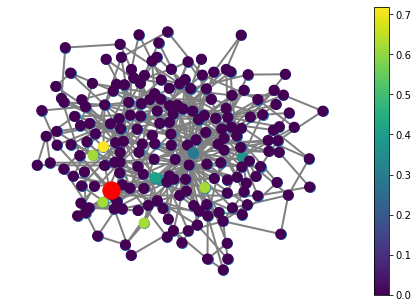

In [77]:
i = 27      # node ID
# -- plot graph
layout = nx.spring_layout(G, seed=seed, iterations=400)
nx.draw(G, pos=layout, edge_color='gray', width=2, with_labels=False, node_size=100)
# -- plot neighborhood
# -- plot neighborhood
nodes = G.nodes()
im2 = nx.draw_networkx_nodes(G, nodelist=nodes, label=nodes, pos=layout, node_color=v_17, node_size=100)
node_17 = nodes = nx.single_source_shortest_path_length(G, i, cutoff=0)
im = nx.draw_networkx_nodes(G, nodelist=node_17, label=node_17, pos=layout, node_color='red')

# -- visualize
plt.colorbar(im2)
plt.show()
plt.close()

200 -> 100 -> 50 -> 20

In [78]:
A_input = keras.Input(name = 'A_input',shape=(200,200),dtype=tf.float64)
H_input = keras.Input(name = 'H_input',shape=(200,200),dtype=tf.float64)
D_input = keras.Input(name = 'D_input',shape=(200,200),dtype=tf.float64)

gcn_layer_1 = GCN(in_features=200,out_features=100)
gcn_layer_2 = GCN(in_features=100,out_features=50)
gcn_layer_3 = GCN(in_features=50,out_features=20)

H_1 = gcn_layer_1(A_input,H_input,D_input)
H_2 = gcn_layer_2(A_input,H_1,D_input)
H_3 = gcn_layer_3(A_input,H_2,D_input)



model = tf.keras.Model(inputs=[A_input,H_input,D_input],
                  outputs=H_3)
model.summary()

Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 A_input (InputLayer)           [(None, 200, 200)]   0           []                               
                                                                                                  
 H_input (InputLayer)           [(None, 200, 200)]   0           []                               
                                                                                                  
 D_input (InputLayer)           [(None, 200, 200)]   0           []                               
                                                                                                  
 gcn_22 (GCN)                   (None, 200, 100)     20000       ['A_input[0][0]',                
                                                                  'H_input[0][0]',          

In [79]:
A_input = tf.convert_to_tensor(A)
H_input = tf.convert_to_tensor(node_featuers)
D_input = D
with tf.GradientTape() as tape:
    tape.watch(H_input)
    H_K = model([A_input,H_input,D_input])

# grads = tape.gradient(H_K,H_input[0])
grads = tape.jacobian(H_K,H_input)
v_17 = tf.reduce_sum(tf.reduce_sum(grads[17],0),1)
v_17.shape

TensorShape([200])

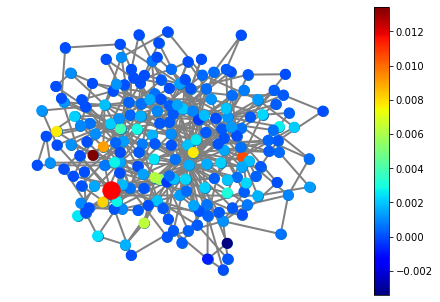

In [80]:
i = 27      # node ID
# -- plot graph
layout = nx.spring_layout(G, seed=seed, iterations=400)
nx.draw(G, pos=layout, edge_color='gray', width=2, with_labels=False, node_size=100)
# -- plot neighborhood
nodes = G.nodes()
im2 = nx.draw_networkx_nodes(G, nodelist=nodes, label=nodes, pos=layout, node_color=v_17, node_size=100,cmap=plt.cm.jet)
node_17 = nodes = nx.single_source_shortest_path_length(G, i, cutoff=0)
im = nx.draw_networkx_nodes(G, nodelist=node_17, label=node_17, pos=layout, node_color='red')

# -- visualize
plt.colorbar(im2)
plt.show()
plt.close()

200 -> 100 -> 50 -> 20 -> 20 -> 20

In [81]:
A_input = keras.Input(name = 'A_input',shape=(200,200),dtype=tf.float64)
H_input = keras.Input(name = 'H_input',shape=(200,200),dtype=tf.float64)
D_input = keras.Input(name = 'D_input',shape=(200,200),dtype=tf.float64)

gcn_layer_1 = GCN(in_features=200,out_features=100)
gcn_layer_2 = GCN(in_features=100,out_features=50)
gcn_layer_3 = GCN(in_features=50,out_features=20)
gcn_layer_4 = GCN(in_features=20,out_features=20)
gcn_layer_5 = GCN(in_features=20,out_features=20)

H_1 = gcn_layer_1(A_input,H_input,D_input)
H_2 = gcn_layer_2(A_input,H_1,D_input)
H_3 = gcn_layer_3(A_input,H_2,D_input)
H_4 = gcn_layer_4(A_input,H_3,D_input)
H_5 = gcn_layer_5(A_input,H_4,D_input)



model = tf.keras.Model(inputs=[A_input,H_input,D_input],
                  outputs=H_5)
model.summary()

Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 A_input (InputLayer)           [(None, 200, 200)]   0           []                               
                                                                                                  
 H_input (InputLayer)           [(None, 200, 200)]   0           []                               
                                                                                                  
 D_input (InputLayer)           [(None, 200, 200)]   0           []                               
                                                                                                  
 gcn_25 (GCN)                   (None, 200, 100)     20000       ['A_input[0][0]',                
                                                                  'H_input[0][0]',          

In [82]:
A_input = tf.convert_to_tensor(A)
H_input = tf.convert_to_tensor(node_featuers)
D_input = D
with tf.GradientTape() as tape:
    tape.watch(H_input)
    H_K = model([A_input,H_input,D_input])

# grads = tape.gradient(H_K,H_input[0])
grads = tape.jacobian(H_K,H_input)
v_17 = tf.reduce_sum(tf.reduce_sum(grads[17],0),1)
v_17.shape

TensorShape([200])

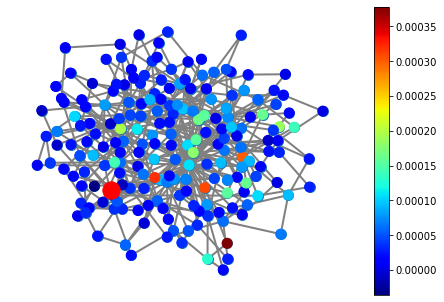

In [83]:
i = 27      # node ID
# -- plot graph
layout = nx.spring_layout(G, seed=seed, iterations=400)
nx.draw(G, pos=layout, edge_color='gray', width=2, with_labels=False, node_size=100)
# -- plot neighborhood
nodes = G.nodes()
im2 = nx.draw_networkx_nodes(G, nodelist=nodes, label=nodes, pos=layout, node_color=v_17, node_size=100,cmap=plt.cm.jet)
node_17 = nodes = nx.single_source_shortest_path_length(G, i, cutoff=0)
im = nx.draw_networkx_nodes(G, nodelist=node_17, label=node_17, pos=layout, node_color='red')

# -- visualize
plt.colorbar(im2)
# plt.clim(-1,1)
plt.show()
plt.close()

## D

By increasing the GCN layers, influnce score decreases and the influnce score for all points became more homogenous.